## XGBoost 모델로 다음달 재고 예측하기


- 참고: https://github.com/kroonstazy/Capstone_Project_2/blob/master/Notebooks/03_XGBoost_Cap_Project_2.ipynb

생각
- industry data로 다음 3달 예측 -> 어차피 우리 회사게 가장 먼저 팔리므로 가장 이윤이 많이 나오는 상품 순으로 개수 잘라서 분배하면 되지 않을까??

### 1. Import and load data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import warnings

from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.impute import SimpleImputer

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit

from sklearn import preprocessing


from tqdm import tqdm

In [2]:
warnings.filterwarnings(action='ignore')

In [3]:
file_path = "./dataset_new/"
retail_data= pd.read_csv(f"{file_path}retail_all.csv") # outlier를 삭제한 데이터
industry_data= pd.read_csv(f"{file_path}industry_all.csv")


In [4]:
industry_data

,Industry Size,Store,Product Type,Item,Year,Month,Datetime,Region Level 1,Region Level 2,Urban/Rural,Owner
0,2,1,Electronics,Keyboard,2015,1,2015-01-01,Eisenstadt-Umgebung,GWR,Urban,1
1,1,1,Grocery,Steak,2015,1,2015-01-01,Eisenstadt-Umgebung,GWR,Urban,1
2,1,1,Home Goods,Paint,2015,1,2015-01-01,Eisenstadt-Umgebung,GWR,Urban,1
3,1,1,Grocery,Shrimp,2015,2,2015-02-01,Eisenstadt-Umgebung,GWR,Urban,1
4,2,1,Electronics,Phone Charger,2015,3,2015-03-01,Eisenstadt-Umgebung,GWR,Urban,1
...,...,...,...,...,...,...,...,...,...,...,...
348684,1,642,Grocery,Noodles,2022,3,2022-03-01,Koillismaa,KTR,Urban,74
348685,1,642,Grocery,King Crab,2022,3,2022-03-01,Koillismaa,KTR,Urban,74
348686,1,642,Home Goods,Glue,2022,3,2022-03-01,Koillismaa,KTR,Urban,74
348687,1,642,Home Goods,Nails,2022,3,2022-03-01,Koillismaa,KTR,Urban,74


## Store별로 나눠서 하면?
- 생각
  - 가게 1 예측-> 가게 1 데이터만 이용
  - set_dt 이전 모든 데이터 => set_dt 이후 예측 (분기 나누지 않음)

In [5]:
store_id = 2
set_dt = "2021-01-01"

In [6]:
industry_data_1 = industry_data[industry_data['Store']==store_id].reset_index(drop=True)
datetime_list = list(dict.fromkeys(list(industry_data_1['Datetime'])))

In [7]:
product_dict = {"Power Cord":"Electronics",
                "Phone Charger":"Electronics",
                "Ear Buds":"Electronics",
                "Mouse":"Electronics",
                "Keyboard":"Electronics",
                "Milk":"Grocery",
                "Eggs":"Grocery",
                "Cereal":"Grocery",
                "Shrimp":"Grocery",
                "Noodles":"Grocery",
                "Steak":"Grocery",
                "King Crab":"Grocery",
                "Tape":"Home Goods",
                "Glue":"Home Goods",
                "Nails":"Home Goods",
                "Bracket":"Home Goods",
                "Brush":"Home Goods",
                "Paint":"Home Goods"
                }

In [8]:
# 추가할 dataframe
new_df = pd.DataFrame(
    [],columns = ['Industry Size', 'Store', 'Product Type', 'Item', 'Year', 'Month','Datetime', 'Region Level 1', 'Region Level 2', 'Urban/Rural', 'Owner']
)

In [9]:
def append_new_sentence(new_df, product,datetime_df_0):
    new_df.loc[len(new_df)] = [
        0, #industry size
        datetime_df_0['Store'], #store
        product,
        product_dict[product],
        datetime_df_0['Year'],
        datetime_df_0['Month'],
        datetime_df_0['Datetime'],
        datetime_df_0['Region Level 1'],
        datetime_df_0['Region Level 2'],
        datetime_df_0['Urban/Rural'],
        datetime_df_0['Owner']
    ]

In [10]:
# 재고 0인 행 목록에 추가
for d in datetime_list:
    datetime_df = industry_data_1[industry_data_1['Datetime']==d] # 해당 datetime의 df
    for product in product_dict: # product: key
        if len(datetime_df[datetime_df['Item']==product])==0:
            append_new_sentence(new_df,product,datetime_df.iloc[0])

In [11]:
# 추가
industry_data_1_add0 = industry_data_1.append(new_df, ignore_index=True)

# 정렬
industry_data_1_add0.sort_values(['Store','Datetime','Item'],inplace=True)
industry_data_1_add0.reset_index(drop=True,inplace=True)
industry_data_1_add0

,Industry Size,Store,Product Type,Item,Year,Month,Datetime,Region Level 1,Region Level 2,Urban/Rural,Owner
0,1,2,Home Goods,Brush,2015,1,2015-01-01,Politischer Bezirk G?ssing,GWR,Urban,1
1,1,2,Electronics,Ear Buds,2015,1,2015-01-01,Politischer Bezirk G?ssing,GWR,Urban,1
2,0,2,Power Cord,Electronics,2015,1,2015-01-01,Politischer Bezirk G?ssing,GWR,Urban,1
3,0,2,Mouse,Electronics,2015,1,2015-01-01,Politischer Bezirk G?ssing,GWR,Urban,1
4,4,2,Home Goods,Glue,2015,1,2015-01-01,Politischer Bezirk G?ssing,GWR,Urban,1
...,...,...,...,...,...,...,...,...,...,...,...
1543,0,2,Paint,Home Goods,2022,3,2022-03-01,Politischer Bezirk G?ssing,GWR,Urban,1
1544,2,2,Grocery,King Crab,2022,3,2022-03-01,Politischer Bezirk G?ssing,GWR,Urban,1
1545,1,2,Grocery,Noodles,2022,3,2022-03-01,Politischer Bezirk G?ssing,GWR,Urban,1
1546,4,2,Grocery,Shrimp,2022,3,2022-03-01,Politischer Bezirk G?ssing,GWR,Urban,1


In [12]:
# Label encoding

label = preprocessing.LabelEncoder()
industry_data_encoded = pd.DataFrame()

industry_data_1_col = ['Product Type', 'Item',
        'Region Level 1', 'Region Level 2', 'Urban/Rural']
for i in industry_data_1_add0.columns:
    if i in industry_data_1_col:
        industry_data_encoded[i] = label.fit_transform(industry_data_1_add0[i])
    else:
        industry_data_encoded[i] = industry_data_1_add0[i]

In [13]:
industry_data_encoded

,Industry Size,Store,Product Type,Item,Year,Month,Datetime,Region Level 1,Region Level 2,Urban/Rural,Owner
0,1,2,8,1,2015,1,2015-01-01,0,0,0,1
1,1,2,5,3,2015,1,2015-01-01,0,0,0,1
2,0,2,17,5,2015,1,2015-01-01,0,0,0,1
3,0,2,12,5,2015,1,2015-01-01,0,0,0,1
4,4,2,8,6,2015,1,2015-01-01,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
1543,0,2,15,8,2022,3,2022-03-01,0,0,0,1
1544,2,2,7,10,2022,3,2022-03-01,0,0,0,1
1545,1,2,7,14,2022,3,2022-03-01,0,0,0,1
1546,4,2,7,18,2022,3,2022-03-01,0,0,0,1


In [14]:
train_1 = industry_data_encoded[industry_data_encoded['Datetime'] < set_dt]
val_1 = industry_data_encoded[industry_data_encoded['Datetime'] >= set_dt] # 2022

In [15]:
# Feature와 Target 분리
target = 'Industry Size'
features = train_1.drop([target,'Datetime'], axis=1).columns

X_train = train_1[features]
y_train = train_1[target]
X_val = val_1[features]
y_val = val_1[target]

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(1278, 9) (1278,)
(270, 9) (270,)


In [16]:
# 확인
X_train.head(3)

,Store,Product Type,Item,Year,Month,Region Level 1,Region Level 2,Urban/Rural,Owner
0,2,8,1,2015,1,0,0,0,1
1,2,5,3,2015,1,0,0,0,1
2,2,17,5,2015,1,0,0,0,1


In [17]:
# 파이프라인 생성 및 학습
xgb_basic = make_pipeline(
    SimpleImputer(),
    RobustScaler(),
    XGBRegressor(random_state=1,
                 n_jobs=-1,
                 objective='reg:squarederror',
                 max_depth=5,
                 learning_rate=0.2))

xgb_basic.fit(X_train, y_train);

In [18]:
# 예측
y_pred = xgb_basic.predict(X_val)

# prediction값 반올림
y_pred_r =  [round(x) if round(x) >=0 else 0 for x in y_pred]

# 결과 확인

print('mae:  ', mae(y_val, y_pred_r))
print('rmse: ', np.sqrt(mse(y_val, y_pred_r)))

mae:   0.4284366179154151
rmse:  0.8721130990514816


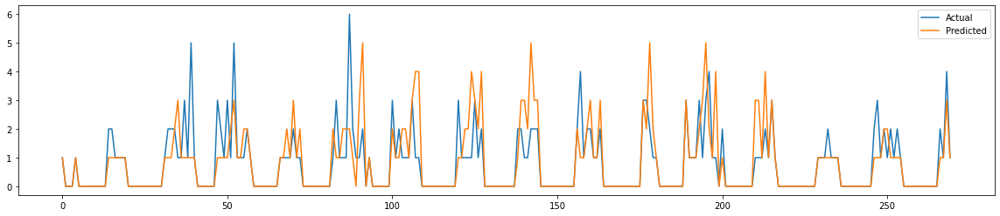

In [20]:
plt.figure(figsize=(20, 4))
plt.plot(industry_data_encoded[industry_data_encoded['Datetime'] >= set_dt]['Industry Size'].reset_index(drop=True), label='Actual',)
plt.plot(y_pred_r, label='Predicted')


plt.legend()
plt.show();

쫌..구리다!


### hyper parameter

In [21]:
# eval set 생성
pre_processing_part = make_pipeline(
    SimpleImputer(),
    RobustScaler())

X_train_processing = pre_processing_part.fit_transform(X_train)
X_val_processing = pre_processing_part.transform(X_val)

eval_set = [(X_train_processing, y_train),
            (X_val_processing, y_val)]

In [22]:
# 모델 생성
xgb_hyper = XGBRegressor(
    random_state=1,
    n_jobs=-1,
    objective='reg:squarederror')

# 사용할 하이퍼 파라미터
dists = {
    'max_depth': [3, 4, 5, 6, 7, 8],
    'min_child_weight': [1, 2, 3, 4],
    'gamma': [0, 0.01, 0.1, 0.2, 0.3],
    'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.3]}

# cv
cv = TimeSeriesSplit(n_splits=5)

# GridSearchCV
reg_xgb_hyper = GridSearchCV(
    xgb_hyper, 
    param_grid=dists,
    cv=cv, 
    scoring='neg_root_mean_squared_error',
    verbose=0,
    n_jobs=-1
)

reg_xgb_hyper.fit(X_train_processing,
                  y_train,
                  eval_set = eval_set,
                  eval_metric='rmse',
                  early_stopping_rounds = 50);

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[0]	validation_0-rmse:0.97472	validation_1-rmse:1.09406
[1]	validation_0-rmse:0.97419	validation_1-rmse:1.09352
[2]	validation_0-rmse:0.97366	validation_1-rmse:1.09298
[3]	validation_0-rmse:0.97314	validation_1-rmse:1.09244
[4]	validation_0-rmse:0.97262	validation_1-rmse:1.09190
[5]	validation_0-rmse:0.97209	validation_1-rmse:1.09137
[6]	validation_0-rmse:0.97157	validation_1-rmse:1.09083
[7]	validation_0-rmse:0.97105	validation_1-rmse:1.09029
[8]	validation_0-rmse:0.97053	validation_1-rmse:1.08976
[9]	validation_0-rmse:0.97001	validation_1-rmse:1.08923
[10]	validation_0-rmse:0.96949	validation_1-rmse:1.08869
[11]	validation_0-rmse:0.96897	validation_1-rmse:1.08816
[12]	validation_0-rmse:0.96845	validation_1-rmse:1.08763
[13]	validation_0-rmse:0.96794	validation_1-rmse:1.08710
[14]	validation_0-rmse:0.96742	validation_1-rmse:1.08657
[15]	validation_0-rmse:0.96691	validation_1-rmse:1.08604
[16]	validation_0-rmse:0.96639	validation_1-rmse:1.08551
[17]	validation_0-rmse:0.96588	validation

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[81]	validation_0-rmse:0.93138	validation_1-rmse:1.04813
[31]	validation_0-rmse:0.95842	validation_1-rmse:1.07743
[34]	validation_0-rmse:0.95580	validation_1-rmse:1.07703
[1]	validation_0-rmse:0.97411	validation_1-rmse:1.09341
[45]	validation_0-rmse:0.94965	validation_1-rmse:1.06608
[82]	validation_0-rmse:0.93087	validation_1-rmse:1.04759
[35]	validation_0-rmse:0.95526	validation_1-rmse:1.07654
[32]	validation_0-rmse:0.95791	validation_1-rmse:1.07692
[0]	validation_0-rmse:0.97470	validation_1-rmse:1.09407
[2]	validation_0-rmse:0.97354	validation_1-rmse:1.09281
[36]	validation_0-rmse:0.95472	validation_1-rmse:1.07605
[46]	validation_0-rmse:0.94912	validation_1-rmse:1.06552
[33]	validation_0-rmse:0.95739	validation_1-rmse:1.07639[83]	validation_0-rmse:0.93037	validation_1-rmse:1.04705

[1]	validation_0-rmse:0.97416	validation_1-rmse:1.09355
[3]	validation_0-rmse:0.97298	validation_1-rmse:1.09222
[37]	validation_0-rmse:0.95418	validation_1-rmse:1.07556
[34]	validation_0-rmse:0.95688	valid

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[14]	validation_0-rmse:0.96728	validation_1-rmse:1.08710
[55]	validation_0-rmse:0.93957	validation_1-rmse:1.05650
[9]	validation_0-rmse:0.96943	validation_1-rmse:1.08919
[25]	validation_0-rmse:0.96071	validation_1-rmse:1.08146
[2]	validation_0-rmse:0.97327	validation_1-rmse:1.09247
[82]	validation_0-rmse:0.93064	validation_1-rmse:1.05428
[33]	validation_0-rmse:0.95550	validation_1-rmse:1.07623
[98]	validation_0-rmse:0.92548	validation_1-rmse:1.04775
[59]	validation_0-rmse:0.94436	validation_1-rmse:1.06552
[15]	validation_0-rmse:0.96675	validation_1-rmse:1.08661
[20]	validation_0-rmse:0.96157	validation_1-rmse:1.07990
[26]	validation_0-rmse:0.96016	validation_1-rmse:1.08097
[83]	validation_0-rmse:0.93014	validation_1-rmse:1.05382[71]	validation_0-rmse:0.93463	validation_1-rmse:1.05716

[46]	validation_0-rmse:0.94619	validation_1-rmse:1.06814
[15]	validation_0-rmse:0.96514	validation_1-rmse:1.08528[10]	validation_0-rmse:0.96885	validation_1-rmse:1.08864

[77]	validation_0-rmse:0.92834	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[83]	validation_0-rmse:0.69248	validation_1-rmse:0.78073
[5]	validation_0-rmse:0.94693	validation_1-rmse:1.06497
[5]	validation_0-rmse:0.94251	validation_1-rmse:1.06000
[42]	validation_0-rmse:0.80079	validation_1-rmse:0.91692
[76]	validation_0-rmse:0.92696	validation_1-rmse:1.04306
[13]	validation_0-rmse:0.91153	validation_1-rmse:1.03010[93]	validation_0-rmse:0.93050	validation_1-rmse:1.04989[67]	validation_0-rmse:0.75543	validation_1-rmse:0.86572


[68]	validation_0-rmse:0.72053	validation_1-rmse:0.81140
[35]	validation_0-rmse:0.83366	validation_1-rmse:0.94637
[21]	validation_0-rmse:0.96154	validation_1-rmse:1.08175
[42]	validation_0-rmse:0.80144	validation_1-rmse:0.91713
[6]	validation_0-rmse:0.94243	validation_1-rmse:1.06029[44]	validation_0-rmse:0.78306	validation_1-rmse:0.88716

[14]	validation_0-rmse:0.90746	validation_1-rmse:1.02595
[84]	validation_0-rmse:0.69086	validation_1-rmse:0.77882[53]	validation_0-rmse:0.94070	validation_1-rmse:1.05802

[94]	validation_0-rmse:0.93005	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[21]	validation_0-rmse:0.85348	validation_1-rmse:0.97385
[98]	validation_0-rmse:0.65140	validation_1-rmse:0.78803
[59]	validation_0-rmse:0.74866	validation_1-rmse:0.87915
[70]	validation_0-rmse:0.68349	validation_1-rmse:0.79680
[80]	validation_0-rmse:0.66471	validation_1-rmse:0.78932
[25]	validation_0-rmse:0.85432	validation_1-rmse:0.97975
[67]	validation_0-rmse:0.69414	validation_1-rmse:0.81714
[15]	validation_0-rmse:0.89345	validation_1-rmse:1.02061
[13]	validation_0-rmse:0.90261	validation_1-rmse:1.02838
[58]	validation_0-rmse:0.72899	validation_1-rmse:0.86840
[6]	validation_0-rmse:0.93525	validation_1-rmse:1.05707
[23]	validation_0-rmse:0.84467	validation_1-rmse:0.96466
[60]	validation_0-rmse:0.74622	validation_1-rmse:0.87681
[99]	validation_0-rmse:0.64998	validation_1-rmse:0.78675
[71]	validation_0-rmse:0.68102	validation_1-rmse:0.79437
[22]	validation_0-rmse:0.84871	validation_1-rmse:0.96935
[16]	validation_0-rmse:0.88896	validation_1-rmse:1.01645[26]	validation_0-rmse:0.85045	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[94]	validation_0-rmse:0.62829	validation_1-rmse:0.76962
[42]	validation_0-rmse:0.76325	validation_1-rmse:0.89431[60]	validation_0-rmse:0.72972	validation_1-rmse:0.86356

[17]	validation_0-rmse:0.87860	validation_1-rmse:1.00457
[41]	validation_0-rmse:0.77078	validation_1-rmse:0.89462
[0]	validation_0-rmse:0.96933	validation_1-rmse:1.08916
[45]	validation_0-rmse:0.78629	validation_1-rmse:0.91437
[93]	validation_0-rmse:0.68339	validation_1-rmse:0.80989
[91]	validation_0-rmse:0.66158	validation_1-rmse:0.79766
[96]	validation_0-rmse:0.62083	validation_1-rmse:0.76479
[0]	validation_0-rmse:0.97023	validation_1-rmse:1.08965
[44]	validation_0-rmse:0.75432	validation_1-rmse:0.87759
[60]	validation_0-rmse:0.70089	validation_1-rmse:0.80754
[61]	validation_0-rmse:0.72708	validation_1-rmse:0.86082
[95]	validation_0-rmse:0.62654	validation_1-rmse:0.76815
[46]	validation_0-rmse:0.78330	validation_1-rmse:0.91147
[18]	validation_0-rmse:0.87383	validation_1-rmse:1.00012
[1]	validation_0-rmse:0.96349	va

scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793:


[75]	validation_0-rmse:0.65852	validation_1-rmse:0.78736
[16]	validation_0-rmse:0.87476	validation_1-rmse:0.98944[13]	validation_0-rmse:0.65740	validation_1-rmse:0.76756

[15]	validation_0-rmse:0.61105	validation_1-rmse:0.70640
[48]	validation_0-rmse:0.55655	validation_1-rmse:0.68591
[97]	validation_0-rmse:0.61275	validation_1-rmse:0.78465
[24]	validation_0-rmse:0.85960	validation_1-rmse:0.98614
[59]	validation_0-rmse:0.70444	validation_1-rmse:0.84475
[14]	validation_0-rmse:0.65066	validation_1-rmse:0.76110
[63]	validation_0-rmse:0.68893	validation_1-rmse:0.79936
[85]	validation_0-rmse:0.67176	validation_1-rmse:0.81253[16]	validation_0-rmse:0.60191	validation_1-rmse:0.70041

[49]	validation_0-rmse:0.55643	validation_1-rmse:0.68477
[43]	validation_0-rmse:0.77504	validation_1-rmse:0.91091
[76]	validation_0-rmse:0.65603	validation_1-rmse:0.78533
[15]	validation_0-rmse:0.64059	validation_1-rmse:0.75504
[58]	validation_0-rmse:0.70506	validation_1-rmse:0.85730
[76]	validation_0-rmse:0.65717

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[47]	validation_0-rmse:0.55962	validation_1-rmse:0.68860
[52]	validation_0-rmse:0.56410	validation_1-rmse:0.70356
[62]	validation_0-rmse:0.66234	validation_1-rmse:0.77576
[2]	validation_0-rmse:0.82889	validation_1-rmse:0.93654
[27]	validation_0-rmse:0.60623	validation_1-rmse:0.73166
[99]	validation_0-rmse:0.54473	validation_1-rmse:0.68457
[26]	validation_0-rmse:0.55922	validation_1-rmse:0.70507
[1]	validation_0-rmse:0.85972	validation_1-rmse:0.97688
[48]	validation_0-rmse:0.55934	validation_1-rmse:0.68834
[53]	validation_0-rmse:0.56331	validation_1-rmse:0.70378
[63]	validation_0-rmse:0.66236	validation_1-rmse:0.77570
[28]	validation_0-rmse:0.60401	validation_1-rmse:0.72910
[3]	validation_0-rmse:0.79287	validation_1-rmse:0.89986
[27]	validation_0-rmse:0.55685	validation_1-rmse:0.70286
[64]	validation_0-rmse:0.66297	validation_1-rmse:0.77726
[49]	validation_0-rmse:0.55867	validation_1-rmse:0.68816
[29]	validation_0-rmse:0.60383	validation_1-rmse:0.72914
[54]	validation_0-rmse:0.56340	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[28]	validation_0-rmse:0.50135	validation_1-rmse:0.71635
[66]	validation_0-rmse:0.67463	validation_1-rmse:0.80087
[6]	validation_0-rmse:0.67213	validation_1-rmse:0.81684
[48]	validation_0-rmse:0.41518	validation_1-rmse:0.76810
[79]	validation_0-rmse:0.58158	validation_1-rmse:0.75265
[20]	validation_0-rmse:0.57172	validation_1-rmse:0.71535
[38]	validation_0-rmse:0.53605	validation_1-rmse:0.86840
[36]	validation_0-rmse:0.57576	validation_1-rmse:0.74433
[40]	validation_0-rmse:0.45935	validation_1-rmse:0.73277
[1]	validation_0-rmse:0.86709	validation_1-rmse:0.99427
[67]	validation_0-rmse:0.67475	validation_1-rmse:0.80092
[73]	validation_0-rmse:0.54573	validation_1-rmse:0.77639
[29]	validation_0-rmse:0.50078	validation_1-rmse:0.72002
[80]	validation_0-rmse:0.58196	validation_1-rmse:0.75327
[37]	validation_0-rmse:0.57498	validation_1-rmse:0.74445[68]	validation_0-rmse:0.67467	validation_1-rmse:0.80115

[21]	validation_0-rmse:0.56908	validation_1-rmse:0.71317[7]	validation_0-rmse:0.64855	vali

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[2]	validation_0-rmse:0.75797	validation_1-rmse:0.87361
[37]	validation_0-rmse:0.52710	validation_1-rmse:0.68741
[17]	validation_0-rmse:0.58527	validation_1-rmse:0.73517
[32]	validation_0-rmse:0.60093	validation_1-rmse:0.74946[3]	validation_0-rmse:0.72202	validation_1-rmse:0.83232

[39]	validation_0-rmse:0.52151	validation_1-rmse:0.67457
[38]	validation_0-rmse:0.52652	validation_1-rmse:0.68734
[43]	validation_0-rmse:0.48399	validation_1-rmse:0.75639
[4]	validation_0-rmse:0.69518	validation_1-rmse:0.80301
[52]	validation_0-rmse:0.49021	validation_1-rmse:0.75234
[33]	validation_0-rmse:0.60058	validation_1-rmse:0.74967
[18]	validation_0-rmse:0.57998	validation_1-rmse:0.73084
[40]	validation_0-rmse:0.52111	validation_1-rmse:0.67464[57]	validation_0-rmse:0.39679	validation_1-rmse:0.78534

[39]	validation_0-rmse:0.52672	validation_1-rmse:0.69027
[0]	validation_0-rmse:0.87407	validation_1-rmse:0.99040
[5]	validation_0-rmse:0.66211	validation_1-rmse:0.78319
[34]	validation_0-rmse:0.60089	valid

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[8]	validation_0-rmse:0.56833	validation_1-rmse:0.71973
[14]	validation_0-rmse:0.57330	validation_1-rmse:0.72024
[20]	validation_0-rmse:0.48038	validation_1-rmse:0.71407
[58]	validation_0-rmse:0.66839	validation_1-rmse:0.81866
[30]	validation_0-rmse:0.56569	validation_1-rmse:0.71758
[48]	validation_0-rmse:0.50829	validation_1-rmse:0.78131
[29]	validation_0-rmse:0.55162	validation_1-rmse:0.75748
[26]	validation_0-rmse:0.66996	validation_1-rmse:0.79196
[15]	validation_0-rmse:0.57113	validation_1-rmse:0.71927
[9]	validation_0-rmse:0.56006	validation_1-rmse:0.71426
[59]	validation_0-rmse:0.66840	validation_1-rmse:0.81862
[3]	validation_0-rmse:0.64172	validation_1-rmse:0.77041
[31]	validation_0-rmse:0.56682	validation_1-rmse:0.71802
[21]	validation_0-rmse:0.47862	validation_1-rmse:0.72016
[27]	validation_0-rmse:0.66992	validation_1-rmse:0.79296
[49]	validation_0-rmse:0.50876	validation_1-rmse:0.78552
[0]	validation_0-rmse:0.87894	validation_1-rmse:0.99914[16]	validation_0-rmse:0.56935	vali

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[32]	validation_0-rmse:0.62542	validation_1-rmse:0.77726
[57]	validation_0-rmse:0.51180	validation_1-rmse:0.84621
[43]	validation_0-rmse:0.58112	validation_1-rmse:0.75123
[12]	validation_0-rmse:0.55379	validation_1-rmse:0.73167
[2]	validation_0-rmse:0.73364	validation_1-rmse:0.86378
[15]	validation_0-rmse:0.64813	validation_1-rmse:0.76463
[32]	validation_0-rmse:0.57515	validation_1-rmse:0.74022
[43]	validation_0-rmse:0.54089	validation_1-rmse:0.73654
[57]	validation_0-rmse:0.39712	validation_1-rmse:0.87438
[52]	validation_0-rmse:0.51347	validation_1-rmse:0.87427
[37]	validation_0-rmse:0.38658	validation_1-rmse:0.82741
[59]	validation_0-rmse:0.56689	validation_1-rmse:0.81706
[33]	validation_0-rmse:0.62613	validation_1-rmse:0.77816
[7]	validation_0-rmse:0.51387	validation_1-rmse:0.73810
[35]	validation_0-rmse:0.50441	validation_1-rmse:0.83836
[16]	validation_0-rmse:0.64804	validation_1-rmse:0.76547
[3]	validation_0-rmse:0.69087	validation_1-rmse:0.82568
[44]	validation_0-rmse:0.58149	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[14]	validation_0-rmse:0.65624	validation_1-rmse:0.78219
[53]	validation_0-rmse:0.51445	validation_1-rmse:0.89109
[52]	validation_0-rmse:0.53311	validation_1-rmse:0.80780
[13]	validation_0-rmse:0.54072	validation_1-rmse:0.65032
[11]	validation_0-rmse:0.57776	validation_1-rmse:0.69576
[56]	validation_0-rmse:0.53394	validation_1-rmse:0.69113
[7]	validation_0-rmse:0.59398	validation_1-rmse:0.70972
[15]	validation_0-rmse:0.65345	validation_1-rmse:0.78405
[4]	validation_0-rmse:0.59175	validation_1-rmse:0.73230
[18]	validation_0-rmse:0.52979	validation_1-rmse:0.67613
[55]	validation_0-rmse:0.64434	validation_1-rmse:0.79891
[36]	validation_0-rmse:0.51324	validation_1-rmse:0.69096
[53]	validation_0-rmse:0.53380	validation_1-rmse:0.81085
[14]	validation_0-rmse:0.53858	validation_1-rmse:0.65051
[12]	validation_0-rmse:0.57728	validation_1-rmse:0.69710
[8]	validation_0-rmse:0.58839	validation_1-rmse:0.70653
[57]	validation_0-rmse:0.53384	validation_1-rmse:0.69038
[16]	validation_0-rmse:0.65380	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `e

idation_0-rmse:0.68236	validation_1-rmse:0.82069
[39]	validation_0-rmse:0.65457	validation_1-rmse:0.80197
[23]	validation_0-rmse:0.58625	validation_1-rmse:0.76383
[43]	validation_0-rmse:0.52288	validation_1-rmse:0.88905
[35]	validation_0-rmse:0.58633	validation_1-rmse:0.75706[45]	validation_0-rmse:0.68339	validation_1-rmse:0.82307

[41]	validation_0-rmse:0.54603	validation_1-rmse:0.74880
[28]	validation_0-rmse:0.51013	validation_1-rmse:0.88247
[53]	validation_0-rmse:0.68271	validation_1-rmse:0.82143
[40]	validation_0-rmse:0.65372	validation_1-rmse:0.80132
[14]	validation_0-rmse:0.54076	validation_1-rmse:0.72432
[2]	validation_0-rmse:0.60950	validation_1-rmse:0.76357
[42]	validation_0-rmse:0.40780	validation_1-rmse:0.84606
[24]	validation_0-rmse:0.58764	validation_1-rmse:0.76564
[11]	validation_0-rmse:0.42438	validation_1-rmse:0.73372
[46]	validation_0-rmse:0.68413	validation_1-rmse:0.82461
[54]	validation_0-rmse:0.68272	validation_1-rmse:0.82185
[36]	validation_0-rmse:0.58710	validatio

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[98]	validation_0-rmse:0.92223	validation_1-rmse:1.03637
[13]	validation_0-rmse:0.96725	validation_1-rmse:1.08557
[52]	validation_0-rmse:0.94837	validation_1-rmse:1.06712
[39]	validation_0-rmse:0.95321	validation_1-rmse:1.07133
[70]	validation_0-rmse:0.93698	validation_1-rmse:1.05408
[5]	validation_0-rmse:0.97202	validation_1-rmse:1.09146
[79]	validation_0-rmse:0.93457	validation_1-rmse:1.05322
[57]	validation_0-rmse:0.94353	validation_1-rmse:1.06594
[85]	validation_0-rmse:0.93478	validation_1-rmse:1.05371
[40]	validation_0-rmse:0.95164	validation_1-rmse:1.07215
[66]	validation_0-rmse:0.93855	validation_1-rmse:1.05396
[26]	validation_0-rmse:0.95858	validation_1-rmse:1.07728
[99]	validation_0-rmse:0.92173	validation_1-rmse:1.03580
[21]	validation_0-rmse:0.42984	validation_1-rmse:0.80040
[53]	validation_0-rmse:0.94788	validation_1-rmse:1.06663
[40]	validation_0-rmse:0.95268	validation_1-rmse:1.07077
[71]	validation_0-rmse:0.93647	validation_1-rmse:1.05354
[6]	validation_0-rmse:0.97149	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[56]	validation_0-rmse:0.94035	validation_1-rmse:1.05980
[8]	validation_0-rmse:0.96936	validation_1-rmse:1.08841
[38]	validation_0-rmse:0.95108	validation_1-rmse:1.07046
[1]	validation_0-rmse:0.97424	validation_1-rmse:1.09361
[43]	validation_0-rmse:0.95095	validation_1-rmse:1.07264[35]	validation_0-rmse:0.95307	validation_1-rmse:1.07434

[97]	validation_0-rmse:0.92567	validation_1-rmse:1.04743
[64]	validation_0-rmse:0.93815	validation_1-rmse:1.05982
[58]	validation_0-rmse:0.93931	validation_1-rmse:1.05848
[20]	validation_0-rmse:0.96409	validation_1-rmse:1.08398
[30]	validation_0-rmse:0.95732	validation_1-rmse:1.07750
[81]	validation_0-rmse:0.93323	validation_1-rmse:1.05475
[2]	validation_0-rmse:0.97374	validation_1-rmse:1.09311
[44]	validation_0-rmse:0.95042	validation_1-rmse:1.07216
[90]	validation_0-rmse:0.92156	validation_1-rmse:1.03982
[57]	validation_0-rmse:0.93976	validation_1-rmse:1.05922
[39]	validation_0-rmse:0.95048	validation_1-rmse:1.06986
[98]	validation_0-rmse:0.92520	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

lidation_0-rmse:0.92957	validation_1-rmse:1.04703
[50]	validation_0-rmse:0.94875	validation_1-rmse:1.06969
[46]	validation_0-rmse:0.94512	validation_1-rmse:1.06238
[11]	validation_0-rmse:0.96763	validation_1-rmse:1.08758
[76]	validation_0-rmse:0.93231	validation_1-rmse:1.05470
[65]	validation_0-rmse:0.94086	validation_1-rmse:1.06222
[59]	validation_0-rmse:0.94096	validation_1-rmse:1.06274
[18]	validation_0-rmse:0.96423	validation_1-rmse:1.08426
[95]	validation_0-rmse:0.92960	validation_1-rmse:1.04899
[96]	validation_0-rmse:0.92642	validation_1-rmse:1.04864
[2]	validation_0-rmse:0.97327	validation_1-rmse:1.09247
[51]	validation_0-rmse:0.94825	validation_1-rmse:1.06922
[84]	validation_0-rmse:0.92437	validation_1-rmse:1.04594
[73]	validation_0-rmse:0.92898	validation_1-rmse:1.04642
[16]	validation_0-rmse:0.96462	validation_1-rmse:1.08463
[96]	validation_0-rmse:0.92916	validation_1-rmse:1.04854
[66]	validation_0-rmse:0.94036	validation_1-rmse:1.06175
[95]	validation_0-rmse:0.91773	validati

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with 

87061
[5]	validation_0-rmse:0.94483	validation_1-rmse:1.06351
[40]	validation_0-rmse:0.79564	validation_1-rmse:0.90108
[47]	validation_0-rmse:0.79941	validation_1-rmse:0.91537
[83]	validation_0-rmse:0.69248	validation_1-rmse:0.78073
[27]	validation_0-rmse:0.84986	validation_1-rmse:0.96732
[67]	validation_0-rmse:0.75510	validation_1-rmse:0.86870
[48]	validation_0-rmse:0.79678	validation_1-rmse:0.91277
[52]	validation_0-rmse:0.94939	validation_1-rmse:1.06884
[12]	validation_0-rmse:0.90679	validation_1-rmse:1.01969
[6]	validation_0-rmse:0.94003	validation_1-rmse:1.05865
[84]	validation_0-rmse:0.69086	validation_1-rmse:0.77882[69]	validation_0-rmse:0.93261	validation_1-rmse:1.05575

[28]	validation_0-rmse:0.84625	validation_1-rmse:0.96362
[68]	validation_0-rmse:0.75323	validation_1-rmse:0.86666[41]	validation_0-rmse:0.79240	validation_1-rmse:0.89741

[49]	validation_0-rmse:0.79430	validation_1-rmse:0.90994
[98]	validation_0-rmse:0.91412	validation_1-rmse:1.03013
[84]	validation_0-rmse:0.92

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with 

[7]	validation_0-rmse:0.92679	validation_1-rmse:1.04635
[80]	validation_0-rmse:0.65567	validation_1-rmse:0.78744
[78]	validation_0-rmse:0.68530	validation_1-rmse:0.82124[80]	validation_0-rmse:0.65610	validation_1-rmse:0.79265

[15]	validation_0-rmse:0.88346	validation_1-rmse:1.00604
[16]	validation_0-rmse:0.89248	validation_1-rmse:1.01568
[97]	validation_0-rmse:0.67567	validation_1-rmse:0.81093
[2]	validation_0-rmse:0.95582	validation_1-rmse:1.07416
[25]	validation_0-rmse:0.84315	validation_1-rmse:0.97116
[41]	validation_0-rmse:0.76893	validation_1-rmse:0.89394
[21]	validation_0-rmse:0.85401	validation_1-rmse:0.97364
[41]	validation_0-rmse:0.77257	validation_1-rmse:0.89210
[8]	validation_0-rmse:0.92109	validation_1-rmse:1.04069
[81]	validation_0-rmse:0.65356	validation_1-rmse:0.78541
[79]	validation_0-rmse:0.68339	validation_1-rmse:0.81933
[17]	validation_0-rmse:0.88813	validation_1-rmse:1.01154
[81]	validation_0-rmse:0.65386	validation_1-rmse:0.79088
[98]	validation_0-rmse:0.67427	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[99]	validation_0-rmse:0.61434	validation_1-rmse:0.72286
[18]	validation_0-rmse:0.86443	validation_1-rmse:0.97975[94]	validation_0-rmse:0.69375	validation_1-rmse:0.83961

[35]	validation_0-rmse:0.78666	validation_1-rmse:0.90535
[78]	validation_0-rmse:0.65745	validation_1-rmse:0.80664
[62]	validation_0-rmse:0.69532	validation_1-rmse:0.84924
[37]	validation_0-rmse:0.79840	validation_1-rmse:0.93117
[14]	validation_0-rmse:0.90083	validation_1-rmse:1.02455
[65]	validation_0-rmse:0.73902	validation_1-rmse:0.87637
[59]	validation_0-rmse:0.72815	validation_1-rmse:0.87092
[99]	validation_0-rmse:0.62359	validation_1-rmse:0.76167
[95]	validation_0-rmse:0.69263	validation_1-rmse:0.83855[13]	validation_0-rmse:0.89973	validation_1-rmse:1.02410

[53]	validation_0-rmse:0.76454	validation_1-rmse:0.89794
[99]	validation_0-rmse:0.61605	validation_1-rmse:0.77599
[66]	validation_0-rmse:0.73716	validation_1-rmse:0.87466
[19]	validation_0-rmse:0.85939	validation_1-rmse:0.97470
[15]	validation_0-rmse:0.89637

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[84]	validation_0-rmse:0.56840	validation_1-rmse:0.70684[57]	validation_0-rmse:0.57388	validation_1-rmse:0.70540

[81]	validation_0-rmse:0.64274	validation_1-rmse:0.80962
[50]	validation_0-rmse:0.77233	validation_1-rmse:0.90816
[75]	validation_0-rmse:0.64742	validation_1-rmse:0.76911
[27]	validation_0-rmse:0.81969	validation_1-rmse:0.93138
[25]	validation_0-rmse:0.56430	validation_1-rmse:0.67850
[72]	validation_0-rmse:0.69529	validation_1-rmse:0.84400
[2]	validation_0-rmse:0.95642	validation_1-rmse:1.07741
[58]	validation_0-rmse:0.57354	validation_1-rmse:0.70585
[85]	validation_0-rmse:0.56804	validation_1-rmse:0.70709
[51]	validation_0-rmse:0.76983	validation_1-rmse:0.90580
[76]	validation_0-rmse:0.64776	validation_1-rmse:0.76972
[26]	validation_0-rmse:0.56216	validation_1-rmse:0.67676
[59]	validation_0-rmse:0.57399	validation_1-rmse:0.70598
[86]	validation_0-rmse:0.56761	validation_1-rmse:0.70721
[52]	validation_0-rmse:0.76738	validation_1-rmse:0.90347
[77]	validation_0-rmse:0.64751	v

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[76]	validation_0-rmse:0.57364	validation_1-rmse:0.70377
[58]	validation_0-rmse:0.54148	validation_1-rmse:0.70879
[5]	validation_0-rmse:0.70747	validation_1-rmse:0.82845[61]	validation_0-rmse:0.66287	validation_1-rmse:0.78023

[85]	validation_0-rmse:0.54325	validation_1-rmse:0.70975
[66]	validation_0-rmse:0.66011	validation_1-rmse:0.81293
[84]	validation_0-rmse:0.52542	validation_1-rmse:0.67255
[45]	validation_0-rmse:0.54285	validation_1-rmse:0.72267
[18]	validation_0-rmse:0.56085	validation_1-rmse:0.71205
[63]	validation_0-rmse:0.50114	validation_1-rmse:0.70686
[46]	validation_0-rmse:0.51843	validation_1-rmse:0.68583
[77]	validation_0-rmse:0.57390	validation_1-rmse:0.70416
[62]	validation_0-rmse:0.66402	validation_1-rmse:0.78064
[59]	validation_0-rmse:0.54144	validation_1-rmse:0.70905
[67]	validation_0-rmse:0.66024	validation_1-rmse:0.81317
[27]	validation_0-rmse:0.50100	validation_1-rmse:0.68333[86]	validation_0-rmse:0.54351	validation_1-rmse:0.71017

[65]	validation_0-rmse:0.68645	v

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[24]	validation_0-rmse:0.58303	validation_1-rmse:0.72592
[53]	validation_0-rmse:0.53840	validation_1-rmse:0.73085
[44]	validation_0-rmse:0.45217	validation_1-rmse:0.74751
[3]	validation_0-rmse:0.76586	validation_1-rmse:0.90704[20]	validation_0-rmse:0.65119	validation_1-rmse:0.77718

[26]	validation_0-rmse:0.54642	validation_1-rmse:0.72122
[49]	validation_0-rmse:0.49730	validation_1-rmse:0.73527
[36]	validation_0-rmse:0.48168	validation_1-rmse:0.71340
[48]	validation_0-rmse:0.55360	validation_1-rmse:0.92018
[79]	validation_0-rmse:0.57481	validation_1-rmse:0.72141
[30]	validation_0-rmse:0.64574	validation_1-rmse:0.79002
[9]	validation_0-rmse:0.66543	validation_1-rmse:0.80971
[21]	validation_0-rmse:0.65221	validation_1-rmse:0.77569
[25]	validation_0-rmse:0.58019	validation_1-rmse:0.72344
[54]	validation_0-rmse:0.53815	validation_1-rmse:0.73057
[27]	validation_0-rmse:0.54549	validation_1-rmse:0.72080
[31]	validation_0-rmse:0.64628	validation_1-rmse:0.79067
[80]	validation_0-rmse:0.57500	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[56]	validation_0-rmse:0.40161	validation_1-rmse:0.80213
[20]	validation_0-rmse:0.65069	validation_1-rmse:0.77787
[15]	validation_0-rmse:0.54750	validation_1-rmse:0.66391
[36]	validation_0-rmse:0.54598	validation_1-rmse:0.68513
[37]	validation_0-rmse:0.63569	validation_1-rmse:0.77107
[62]	validation_0-rmse:0.57606	validation_1-rmse:0.70694
[21]	validation_0-rmse:0.65079	validation_1-rmse:0.77920
[70]	validation_0-rmse:0.67248	validation_1-rmse:0.80266
[44]	validation_0-rmse:0.60762	validation_1-rmse:0.75740
[47]	validation_0-rmse:0.52682	validation_1-rmse:0.66755
[26]	validation_0-rmse:0.55569	validation_1-rmse:0.71991
[38]	validation_0-rmse:0.64029	validation_1-rmse:0.77286
[37]	validation_0-rmse:0.54550	validation_1-rmse:0.68541
[63]	validation_0-rmse:0.57400	validation_1-rmse:0.70442
[61]	validation_0-rmse:0.49027	validation_1-rmse:0.82447
[16]	validation_0-rmse:0.54512	validation_1-rmse:0.66229
[22]	validation_0-rmse:0.65051	validation_1-rmse:0.77965
[71]	validation_0-rmse:0.67248	

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with 


[43]	validation_0-rmse:0.50439	validation_1-rmse:0.79118
[12]	validation_0-rmse:0.54965	validation_1-rmse:0.73198
[13]	validation_0-rmse:0.52596	validation_1-rmse:0.82443
[10]	validation_0-rmse:0.58667	validation_1-rmse:0.74046
[36]	validation_0-rmse:0.47137	validation_1-rmse:0.75213
[50]	validation_0-rmse:0.65769	validation_1-rmse:0.81658
[49]	validation_0-rmse:0.44210	validation_1-rmse:0.81199
[20]	validation_0-rmse:0.54126	validation_1-rmse:0.73538
[7]	validation_0-rmse:0.51633	validation_1-rmse:0.72280
[44]	validation_0-rmse:0.50455	validation_1-rmse:0.79539
[51]	validation_0-rmse:0.65769	validation_1-rmse:0.81658
[13]	validation_0-rmse:0.54661	validation_1-rmse:0.73346
[11]	validation_0-rmse:0.58272	validation_1-rmse:0.73719
[14]	validation_0-rmse:0.52835	validation_1-rmse:0.83566
[37]	validation_0-rmse:0.47031	validation_1-rmse:0.75171
[52]	validation_0-rmse:0.65769	validation_1-rmse:0.81658
[21]	validation_0-rmse:0.54067	validation_1-rmse:0.73625
[50]	validation_0-rmse:0.44054	

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

dation_1-rmse:0.85641
[19]	validation_0-rmse:0.54915	validation_1-rmse:0.68586
[38]	validation_0-rmse:0.55088	validation_1-rmse:0.78870
[6]	validation_0-rmse:0.60280	validation_1-rmse:0.72316
[57]	validation_0-rmse:0.64895	validation_1-rmse:0.79785
[35]	validation_0-rmse:0.57652	validation_1-rmse:0.73490
[16]	validation_0-rmse:0.65183	validation_1-rmse:0.77324
[4]	validation_0-rmse:0.64127	validation_1-rmse:0.78562
[35]	validation_0-rmse:0.43466	validation_1-rmse:0.77302
[10]	validation_0-rmse:0.54867	validation_1-rmse:0.66477
[20]	validation_0-rmse:0.54733	validation_1-rmse:0.68336
[58]	validation_0-rmse:0.64896	validation_1-rmse:0.79820
[7]	validation_0-rmse:0.59579	validation_1-rmse:0.71673
[30]	validation_0-rmse:0.54999	validation_1-rmse:0.94597
[52]	validation_0-rmse:0.51068	validation_1-rmse:0.85739
[17]	validation_0-rmse:0.65346	validation_1-rmse:0.77579
[8]	validation_0-rmse:0.58922	validation_1-rmse:0.71326
[36]	validation_0-rmse:0.57599	validation_1-rmse:0.73494
[21]	validati

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[13]	validation_0-rmse:0.47559	validation_1-rmse:0.72036
[25]	validation_0-rmse:0.50774	validation_1-rmse:0.75575
[49]	validation_0-rmse:0.69209	validation_1-rmse:0.80983
[15]	validation_0-rmse:0.54255	validation_1-rmse:0.71289
[38]	validation_0-rmse:0.56619	validation_1-rmse:0.79102
[38]	validation_0-rmse:0.67619	validation_1-rmse:0.82292
[41]	validation_0-rmse:0.57647	validation_1-rmse:0.73426
[10]	validation_0-rmse:0.51015	validation_1-rmse:0.78188
[52]	validation_0-rmse:0.43722	validation_1-rmse:0.80914
[37]	validation_0-rmse:0.57579	validation_1-rmse:0.73166[25]	validation_0-rmse:0.41412	validation_1-rmse:0.79642

[50]	validation_0-rmse:0.69209	validation_1-rmse:0.80983
[1]	validation_0-rmse:0.70786	validation_1-rmse:0.84216
[39]	validation_0-rmse:0.67619	validation_1-rmse:0.82292
[26]	validation_0-rmse:0.50684	validation_1-rmse:0.75761
[14]	validation_0-rmse:0.47459	validation_1-rmse:0.72095
[16]	validation_0-rmse:0.54144	validation_1-rmse:0.71357
[42]	validation_0-rmse:0.57614	v

scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793:

[16]	validation_0-rmse:0.57656	validation_1-rmse:0.72501
[52]	validation_0-rmse:0.53355	validation_1-rmse:0.95257
[9]	validation_0-rmse:0.96961	validation_1-rmse:1.08867
[29]	validation_0-rmse:0.55229	validation_1-rmse:0.78484
[52]	validation_0-rmse:0.94965	validation_1-rmse:1.06880
[25]	validation_0-rmse:0.41368	validation_1-rmse:0.82561
[29]	validation_0-rmse:0.55408	validation_1-rmse:0.97115
[15]	validation_0-rmse:0.96745	validation_1-rmse:1.08654
[26]	validation_0-rmse:0.96130	validation_1-rmse:1.08032
[53]	validation_0-rmse:0.94919	validation_1-rmse:1.06834
[21]	validation_0-rmse:0.57232	validation_1-rmse:0.71713
[41]	validation_0-rmse:0.41788	validation_1-rmse:0.84880
[10]	validation_0-rmse:0.96905	validation_1-rmse:1.08808
[37]	validation_0-rmse:0.53568	validation_1-rmse:0.77376
[17]	validation_0-rmse:0.57832	validation_1-rmse:0.72679
[10]	validation_0-rmse:0.49153	validation_1-rmse:0.70652
[16]	validation_0-rmse:0.96697	validation_1-rmse:1.08603[45]	validation_0-rmse:0.36556	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[23]	validation_0-rmse:0.96023	validation_1-rmse:1.07957
[85]	validation_0-rmse:0.92727	validation_1-rmse:1.04925
[80]	validation_0-rmse:0.92714	validation_1-rmse:1.04538
[87]	validation_0-rmse:0.92803	validation_1-rmse:1.05160
[44]	validation_0-rmse:0.94781	validation_1-rmse:1.06612
[72]	validation_0-rmse:0.93763	validation_1-rmse:1.05898
[34]	validation_0-rmse:0.95372	validation_1-rmse:1.07294
[51]	validation_0-rmse:0.94596	validation_1-rmse:1.06652
[44]	validation_0-rmse:0.94755	validation_1-rmse:1.06678
[5]	validation_0-rmse:0.97170	validation_1-rmse:1.09119[29]	validation_0-rmse:0.95934	validation_1-rmse:1.07958

[88]	validation_0-rmse:0.92752	validation_1-rmse:1.05112
[98]	validation_0-rmse:0.91690	validation_1-rmse:1.03591
[86]	validation_0-rmse:0.92674	validation_1-rmse:1.04876
[73]	validation_0-rmse:0.93714	validation_1-rmse:1.05851
[24]	validation_0-rmse:0.95961	validation_1-rmse:1.07895
[81]	validation_0-rmse:0.92658	validation_1-rmse:1.04479
[45]	validation_0-rmse:0.94723	v

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[45]	validation_0-rmse:0.94576	validation_1-rmse:1.06304
[7]	validation_0-rmse:0.97016	validation_1-rmse:1.08983
[65]	validation_0-rmse:0.93373	validation_1-rmse:1.05135
[44]	validation_0-rmse:0.94731	validation_1-rmse:1.06915
[60]	validation_0-rmse:0.94192	validation_1-rmse:1.06429[7]	validation_0-rmse:0.97097	validation_1-rmse:1.09062

[72]	validation_0-rmse:0.93784	validation_1-rmse:1.05956
[39]	validation_0-rmse:0.95064	validation_1-rmse:1.07189
[48]	validation_0-rmse:0.95125	validation_1-rmse:1.07059
[7]	validation_0-rmse:0.97089	validation_1-rmse:1.09053
[37]	validation_0-rmse:0.95349	validation_1-rmse:1.07417
[95]	validation_0-rmse:0.91620	validation_1-rmse:1.03240
[83]	validation_0-rmse:0.92813	validation_1-rmse:1.05127[61]	validation_0-rmse:0.94139	validation_1-rmse:1.06381

[8]	validation_0-rmse:0.97044	validation_1-rmse:1.09012
[49]	validation_0-rmse:0.95078	validation_1-rmse:1.07013
[46]	validation_0-rmse:0.94514	validation_1-rmse:1.06237
[73]	validation_0-rmse:0.93735	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[28]	validation_0-rmse:0.95637	validation_1-rmse:1.07447
[58]	validation_0-rmse:0.93763	validation_1-rmse:1.05472
[52]	validation_0-rmse:0.94248	validation_1-rmse:1.06445
[95]	validation_0-rmse:0.92402	validation_1-rmse:1.04792
[89]	validation_0-rmse:0.91911	validation_1-rmse:1.03487
[80]	validation_0-rmse:0.93635	validation_1-rmse:1.05565
[65]	validation_0-rmse:0.93930	validation_1-rmse:1.06190
[14]	validation_0-rmse:0.96582	validation_1-rmse:1.08583
[76]	validation_0-rmse:0.93589	validation_1-rmse:1.05773
[49]	validation_0-rmse:0.94455	validation_1-rmse:1.06567
[96]	validation_0-rmse:0.92352	validation_1-rmse:1.04748
[16]	validation_0-rmse:0.96414	validation_1-rmse:1.08263
[81]	validation_0-rmse:0.93589	validation_1-rmse:1.05519
[66]	validation_0-rmse:0.93878	validation_1-rmse:1.06141
[17]	validation_0-rmse:0.96468	validation_1-rmse:1.08477
[96]	validation_0-rmse:0.91697	validation_1-rmse:1.04239
[29]	validation_0-rmse:0.95573	validation_1-rmse:1.07380
[59]	validation_0-rmse:0.93702

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea



[50]	validation_0-rmse:0.77034	validation_1-rmse:0.90430
[5]	validation_0-rmse:0.93839	validation_1-rmse:1.05774
[97]	validation_0-rmse:0.67888	validation_1-rmse:0.80668
[54]	validation_0-rmse:0.72692	validation_1-rmse:0.84040
[22]	validation_0-rmse:0.84875	validation_1-rmse:0.96952
[86]	validation_0-rmse:0.70281	validation_1-rmse:0.83790
[89]	validation_0-rmse:0.92156	validation_1-rmse:1.04454[32]	validation_0-rmse:0.81504	validation_1-rmse:0.94689

[48]	validation_0-rmse:0.74486	validation_1-rmse:0.85439
[82]	validation_0-rmse:0.70096	validation_1-rmse:0.82771[44]	validation_0-rmse:0.77716	validation_1-rmse:0.90630

[51]	validation_0-rmse:0.76777	validation_1-rmse:0.90210
[15]	validation_0-rmse:0.89682	validation_1-rmse:1.02033
[70]	validation_0-rmse:0.68358	validation_1-rmse:0.79691
[98]	validation_0-rmse:0.67749	validation_1-rmse:0.80535
[87]	validation_0-rmse:0.70158	validation_1-rmse:0.83659
[6]	validation_0-rmse:0.93252	validation_1-rmse:1.05188
[55]	validation_0-rmse:0.72391	

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[30]	validation_0-rmse:0.83228	validation_1-rmse:0.96259
[59]	validation_0-rmse:0.74726	validation_1-rmse:0.87868
[61]	validation_0-rmse:0.70105	validation_1-rmse:0.82921
[82]	validation_0-rmse:0.70058	validation_1-rmse:0.82856
[1]	validation_0-rmse:0.96527	validation_1-rmse:1.08463
[56]	validation_0-rmse:0.71676	validation_1-rmse:0.85564
[31]	validation_0-rmse:0.82867	validation_1-rmse:0.95912
[53]	validation_0-rmse:0.76358	validation_1-rmse:0.89351
[92]	validation_0-rmse:0.65774	validation_1-rmse:0.80379
[45]	validation_0-rmse:0.77272	validation_1-rmse:0.90560
[22]	validation_0-rmse:0.85728	validation_1-rmse:0.98467
[80]	validation_0-rmse:0.65604	validation_1-rmse:0.77077
[60]	validation_0-rmse:0.74473	validation_1-rmse:0.87635
[2]	validation_0-rmse:0.96039	validation_1-rmse:1.07980
[83]	validation_0-rmse:0.69875	validation_1-rmse:0.82673
[47]	validation_0-rmse:0.74196	validation_1-rmse:0.84886
[51]	validation_0-rmse:0.73182	validation_1-rmse:0.86717
[32]	validation_0-rmse:0.82512	v

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[37]	validation_0-rmse:0.82372	validation_1-rmse:0.94225
[73]	validation_0-rmse:0.66449	validation_1-rmse:0.80571
[72]	validation_0-rmse:0.71715	validation_1-rmse:0.85670
[87]	validation_0-rmse:0.69083	validation_1-rmse:0.82657
[21]	validation_0-rmse:0.85216	validation_1-rmse:0.97853
[8]	validation_0-rmse:0.92089	validation_1-rmse:1.04408
[17]	validation_0-rmse:0.87930	validation_1-rmse:1.00584
[81]	validation_0-rmse:0.68306	validation_1-rmse:0.82186
[75]	validation_0-rmse:0.65335	validation_1-rmse:0.82581
[87]	validation_0-rmse:0.66617	validation_1-rmse:0.81956
[38]	validation_0-rmse:0.82065	validation_1-rmse:0.93937
[88]	validation_0-rmse:0.68930	validation_1-rmse:0.82506
[73]	validation_0-rmse:0.71503	validation_1-rmse:0.85485
[70]	validation_0-rmse:0.67426	validation_1-rmse:0.83104
[74]	validation_0-rmse:0.66206	validation_1-rmse:0.80392
[22]	validation_0-rmse:0.84739	validation_1-rmse:0.97413
[46]	validation_0-rmse:0.76756	validation_1-rmse:0.90247[82]	validation_0-rmse:0.68121	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[26]	validation_0-rmse:0.55910	validation_1-rmse:0.70504
[83]	validation_0-rmse:0.56481	validation_1-rmse:0.70503
[5]	validation_0-rmse:0.70335	validation_1-rmse:0.81229[6]	validation_0-rmse:0.71903	validation_1-rmse:0.84609

[2]	validation_0-rmse:0.95656	validation_1-rmse:1.07708
[59]	validation_0-rmse:0.65377	validation_1-rmse:0.76725
[5]	validation_0-rmse:0.74238	validation_1-rmse:0.87942
[8]	validation_0-rmse:0.69671	validation_1-rmse:0.82893
[4]	validation_0-rmse:0.73416	validation_1-rmse:0.86142
[57]	validation_0-rmse:0.52940	validation_1-rmse:0.75193
[18]	validation_0-rmse:0.59122	validation_1-rmse:0.69308
[88]	validation_0-rmse:0.56543	validation_1-rmse:0.70649
[92]	validation_0-rmse:0.70473	validation_1-rmse:0.82964
[6]	validation_0-rmse:0.69614	validation_1-rmse:0.83765[16]	validation_0-rmse:0.56602	validation_1-rmse:0.70884

[84]	validation_0-rmse:0.56481	validation_1-rmse:0.70502
[7]	validation_0-rmse:0.70026	validation_1-rmse:0.82596
[60]	validation_0-rmse:0.65377	validat

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[6]	validation_0-rmse:0.69391	validation_1-rmse:0.83580
[92]	validation_0-rmse:0.56545	validation_1-rmse:0.71567
[66]	validation_0-rmse:0.42694	validation_1-rmse:0.78381
[47]	validation_0-rmse:0.65004	validation_1-rmse:0.78817
[55]	validation_0-rmse:0.50742	validation_1-rmse:0.81593
[63]	validation_0-rmse:0.54683	validation_1-rmse:0.71752
[37]	validation_0-rmse:0.49751	validation_1-rmse:0.69562
[65]	validation_0-rmse:0.53356	validation_1-rmse:0.71601[18]	validation_0-rmse:0.59716	validation_1-rmse:0.73351

[41]	validation_0-rmse:0.46744	validation_1-rmse:0.73479
[93]	validation_0-rmse:0.56545	validation_1-rmse:0.71567
[19]	validation_0-rmse:0.53114	validation_1-rmse:0.76700
[59]	validation_0-rmse:0.56803	validation_1-rmse:0.70732
[7]	validation_0-rmse:0.67298	validation_1-rmse:0.81653
[35]	validation_0-rmse:0.50839	validation_1-rmse:0.70875
[48]	validation_0-rmse:0.65004	validation_1-rmse:0.78815
[16]	validation_0-rmse:0.57663	validation_1-rmse:0.74631
[64]	validation_0-rmse:0.54686	v

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[61]	validation_0-rmse:0.66248	validation_1-rmse:0.77612
[69]	validation_0-rmse:0.54393	validation_1-rmse:0.75900
[45]	validation_0-rmse:0.50296	validation_1-rmse:0.83063
[15]	validation_0-rmse:0.54196	validation_1-rmse:0.70197
[45]	validation_0-rmse:0.65549	validation_1-rmse:0.77136
[14]	validation_0-rmse:0.62495	validation_1-rmse:0.75695
[8]	validation_0-rmse:0.67854	validation_1-rmse:0.82106
[94]	validation_0-rmse:0.57057	validation_1-rmse:0.72094
[74]	validation_0-rmse:0.56899	validation_1-rmse:0.71920
[50]	validation_0-rmse:0.42566	validation_1-rmse:0.76268
[62]	validation_0-rmse:0.66248	validation_1-rmse:0.77612
[46]	validation_0-rmse:0.65577	validation_1-rmse:0.77269
[46]	validation_0-rmse:0.41253	validation_1-rmse:0.76293
[24]	validation_0-rmse:0.56335	validation_1-rmse:0.72248
[25]	validation_0-rmse:0.55443	validation_1-rmse:0.72175
[70]	validation_0-rmse:0.54392	validation_1-rmse:0.75900
[15]	validation_0-rmse:0.61937	validation_1-rmse:0.74962
[95]	validation_0-rmse:0.57057	v

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[58]	validation_0-rmse:0.53490	validation_1-rmse:0.84126[21]	validation_0-rmse:0.52400	validation_1-rmse:0.70277

[66]	validation_0-rmse:0.50865	validation_1-rmse:0.74135
[69]	validation_0-rmse:0.54072	validation_1-rmse:0.70938
[25]	validation_0-rmse:0.56579	validation_1-rmse:0.71336
[75]	validation_0-rmse:0.55554	validation_1-rmse:0.69020[23]	validation_0-rmse:0.55501	validation_1-rmse:0.70433

[59]	validation_0-rmse:0.65477	validation_1-rmse:0.76954
[3]	validation_0-rmse:0.69041	validation_1-rmse:0.82166
[44]	validation_0-rmse:0.56394	validation_1-rmse:0.70334
[34]	validation_0-rmse:0.55014	validation_1-rmse:0.74180
[28]	validation_0-rmse:0.49605	validation_1-rmse:0.71121
[76]	validation_0-rmse:0.55554	validation_1-rmse:0.69020
[67]	validation_0-rmse:0.43121	validation_1-rmse:0.78639
[26]	validation_0-rmse:0.56574	validation_1-rmse:0.71404
[22]	validation_0-rmse:0.52225	validation_1-rmse:0.70200[59]	validation_0-rmse:0.53371	validation_1-rmse:0.84253

[7]	validation_0-rmse:0.54189	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[2]	validation_0-rmse:0.71426	validation_1-rmse:0.85731
[8]	validation_0-rmse:0.63982	validation_1-rmse:0.76505
[46]	validation_0-rmse:0.63761	validation_1-rmse:0.78419
[59]	validation_0-rmse:0.54258	validation_1-rmse:0.76475
[34]	validation_0-rmse:0.57041	validation_1-rmse:0.71714
[24]	validation_0-rmse:0.49830	validation_1-rmse:0.77783
[54]	validation_0-rmse:0.51097	validation_1-rmse:0.86612
[43]	validation_0-rmse:0.64789	validation_1-rmse:0.78027
[9]	validation_0-rmse:0.64050	validation_1-rmse:0.76364
[17]	validation_0-rmse:0.56816	validation_1-rmse:0.71692
[47]	validation_0-rmse:0.63761	validation_1-rmse:0.78419
[38]	validation_0-rmse:0.38010	validation_1-rmse:0.81008
[34]	validation_0-rmse:0.50197	validation_1-rmse:0.77567
[3]	validation_0-rmse:0.66969	validation_1-rmse:0.81469
[35]	validation_0-rmse:0.57063	validation_1-rmse:0.71780
[44]	validation_0-rmse:0.64789	validation_1-rmse:0.78027
[10]	validation_0-rmse:0.63685	validation_1-rmse:0.75889
[48]	validation_0-rmse:0.63761	vali

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[32]	validation_0-rmse:0.53984	validation_1-rmse:0.89566
[5]	validation_0-rmse:0.52693	validation_1-rmse:0.68959
[55]	validation_0-rmse:0.55528	validation_1-rmse:0.71584
[50]	validation_0-rmse:0.56422	validation_1-rmse:0.71642
[7]	validation_0-rmse:0.66013	validation_1-rmse:0.76892
[47]	validation_0-rmse:0.49392	validation_1-rmse:0.70112
[37]	validation_0-rmse:0.65731	validation_1-rmse:0.76899
[7]	validation_0-rmse:0.58414	validation_1-rmse:0.70757
[49]	validation_0-rmse:0.52327	validation_1-rmse:0.88223
[10]	validation_0-rmse:0.54517	validation_1-rmse:0.71584
[51]	validation_0-rmse:0.56422	validation_1-rmse:0.71642
[8]	validation_0-rmse:0.65804	validation_1-rmse:0.77118
[56]	validation_0-rmse:0.55528	validation_1-rmse:0.71584
[33]	validation_0-rmse:0.53974	validation_1-rmse:0.89617
[38]	validation_0-rmse:0.65731	validation_1-rmse:0.76899
[48]	validation_0-rmse:0.49392	validation_1-rmse:0.70112
[6]	validation_0-rmse:0.51427	validation_1-rmse:0.68463[8]	validation_0-rmse:0.58219	valida

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[9]	validation_0-rmse:0.49563	validation_1-rmse:0.68865
[15]	validation_0-rmse:0.96722	validation_1-rmse:1.08633
[28]	validation_0-rmse:0.54429	validation_1-rmse:0.75762[36]	validation_0-rmse:0.54646	validation_1-rmse:0.76086

[33]	validation_0-rmse:0.57415	validation_1-rmse:0.73138
[0]	validation_0-rmse:0.97472	validation_1-rmse:1.09406
[16]	validation_0-rmse:0.96672	validation_1-rmse:1.08582
[20]	validation_0-rmse:0.57475	validation_1-rmse:0.72099
[49]	validation_0-rmse:0.37862	validation_1-rmse:0.82675
[26]	validation_0-rmse:0.51394	validation_1-rmse:0.90701
[17]	validation_0-rmse:0.96622	validation_1-rmse:1.08531
[53]	validation_0-rmse:0.44173	validation_1-rmse:0.78840
[34]	validation_0-rmse:0.57415	validation_1-rmse:0.73138[37]	validation_0-rmse:0.54646	validation_1-rmse:0.76085

[1]	validation_0-rmse:0.97419	validation_1-rmse:1.09352
[16]	validation_0-rmse:0.43068	validation_1-rmse:0.79297
[10]	validation_0-rmse:0.49327	validation_1-rmse:0.69657
[21]	validation_0-rmse:0.57434	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[50]	validation_0-rmse:0.94842	validation_1-rmse:1.06886
[22]	validation_0-rmse:0.96085	validation_1-rmse:1.08020
[24]	validation_0-rmse:0.96087	validation_1-rmse:1.08069
[12]	validation_0-rmse:0.96716	validation_1-rmse:1.08612
[61]	validation_0-rmse:0.94117	validation_1-rmse:1.05684
[24]	validation_0-rmse:0.95976	validation_1-rmse:1.07904
[33]	validation_0-rmse:0.95557	validation_1-rmse:1.07585
[6]	validation_0-rmse:0.97087	validation_1-rmse:1.09002[37]	validation_0-rmse:0.95392	validation_1-rmse:1.07444

[93]	validation_0-rmse:0.92001	validation_1-rmse:1.03780
[35]	validation_0-rmse:0.95296	validation_1-rmse:1.07207
[40]	validation_0-rmse:0.95357	validation_1-rmse:1.07423
[51]	validation_0-rmse:0.94791	validation_1-rmse:1.06837
[8]	validation_0-rmse:0.97039	validation_1-rmse:1.09004
[44]	validation_0-rmse:0.94913	validation_1-rmse:1.07024
[38]	validation_0-rmse:0.95338	validation_1-rmse:1.07392[25]	validation_0-rmse:0.96030	validation_1-rmse:1.08016

[23]	validation_0-rmse:0.96024	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[79]	validation_0-rmse:0.93089	validation_1-rmse:1.05319
[20]	validation_0-rmse:0.96296	validation_1-rmse:1.08319
[66]	validation_0-rmse:0.93284	validation_1-rmse:1.04924
[77]	validation_0-rmse:0.73593	validation_1-rmse:0.84808
[31]	validation_0-rmse:0.95443	validation_1-rmse:1.07245
[7]	validation_0-rmse:0.97095	validation_1-rmse:1.09059
[0]	validation_0-rmse:0.97461	validation_1-rmse:1.09400
[82]	validation_0-rmse:0.93220	validation_1-rmse:1.05446
[46]	validation_0-rmse:0.94632	validation_1-rmse:1.06760
[45]	validation_0-rmse:0.95254	validation_1-rmse:1.07146
[20]	validation_0-rmse:0.96163	validation_1-rmse:1.07996
[78]	validation_0-rmse:0.73424	validation_1-rmse:0.84640
[85]	validation_0-rmse:0.92318	validation_1-rmse:1.04665
[74]	validation_0-rmse:0.92963	validation_1-rmse:1.05365
[62]	validation_0-rmse:0.93513	validation_1-rmse:1.05211
[8]	validation_0-rmse:0.97041	validation_1-rmse:1.09010
[80]	validation_0-rmse:0.93036	validation_1-rmse:1.05269
[46]	validation_0-rmse:0.95207	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[10]	validation_0-rmse:0.92463	validation_1-rmse:1.04223[13]	validation_0-rmse:0.90291	validation_1-rmse:1.01783

[57]	validation_0-rmse:0.73638	validation_1-rmse:0.87139
[90]	validation_0-rmse:0.69981	validation_1-rmse:0.81456[5]	validation_0-rmse:0.94368	validation_1-rmse:1.06430

[7]	validation_0-rmse:0.93780	validation_1-rmse:1.05604
[93]	validation_0-rmse:0.71218	validation_1-rmse:0.81829
[84]	validation_0-rmse:0.72529	validation_1-rmse:0.83714
[7]	validation_0-rmse:0.93147	validation_1-rmse:1.05319
[19]	validation_0-rmse:0.86478	validation_1-rmse:0.98216
[72]	validation_0-rmse:0.72349	validation_1-rmse:0.85905
[11]	validation_0-rmse:0.92037	validation_1-rmse:1.03780
[43]	validation_0-rmse:0.78615	validation_1-rmse:0.89063
[8]	validation_0-rmse:0.93340	validation_1-rmse:1.05156
[14]	validation_0-rmse:0.89828	validation_1-rmse:1.01288
[6]	validation_0-rmse:0.93866	validation_1-rmse:1.05949[85]	validation_0-rmse:0.72381	validation_1-rmse:0.83549

[91]	validation_0-rmse:0.69837	valid

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[63]	validation_0-rmse:0.71656	validation_1-rmse:0.85834[95]	validation_0-rmse:0.63764	validation_1-rmse:0.76308

[79]	validation_0-rmse:0.65762	validation_1-rmse:0.79171
[92]	validation_0-rmse:0.63298	validation_1-rmse:0.77250
[92]	validation_0-rmse:0.63310	validation_1-rmse:0.74657
[12]	validation_0-rmse:0.90977	validation_1-rmse:1.03297
[73]	validation_0-rmse:0.71689	validation_1-rmse:0.85054
[66]	validation_0-rmse:0.69413	validation_1-rmse:0.80739
[36]	validation_0-rmse:0.80002	validation_1-rmse:0.93233
[59]	validation_0-rmse:0.74942	validation_1-rmse:0.88245
[13]	validation_0-rmse:0.90518	validation_1-rmse:1.02864
[17]	validation_0-rmse:0.88075	validation_1-rmse:1.00638
[64]	validation_0-rmse:0.71410	validation_1-rmse:0.85625
[13]	validation_0-rmse:0.90518	validation_1-rmse:1.02864
[2]	validation_0-rmse:0.95648	validation_1-rmse:1.07583
[96]	validation_0-rmse:0.63602	validation_1-rmse:0.76148
[74]	validation_0-rmse:0.71482	validation_1-rmse:0.84858
[60]	validation_0-rmse:0.74724	v

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[80]	validation_0-rmse:0.71067	validation_1-rmse:0.84420
[45]	validation_0-rmse:0.75304	validation_1-rmse:0.88399
[18]	validation_0-rmse:0.87582	validation_1-rmse:1.00217
[7]	validation_0-rmse:0.92476	validation_1-rmse:1.04077
[18]	validation_0-rmse:0.88960	validation_1-rmse:1.00791
[91]	validation_0-rmse:0.68190	validation_1-rmse:0.82115
[6]	validation_0-rmse:0.93227	validation_1-rmse:1.05430
[66]	validation_0-rmse:0.68713	validation_1-rmse:0.82162
[30]	validation_0-rmse:0.83602	validation_1-rmse:0.96472
[12]	validation_0-rmse:0.90952	validation_1-rmse:1.03332
[81]	validation_0-rmse:0.70928	validation_1-rmse:0.84268
[31]	validation_0-rmse:0.82117	validation_1-rmse:0.95014
[19]	validation_0-rmse:0.88567	validation_1-rmse:1.00395
[83]	validation_0-rmse:0.64218	validation_1-rmse:0.80537
[61]	validation_0-rmse:0.69840	validation_1-rmse:0.82737
[19]	validation_0-rmse:0.87124	validation_1-rmse:0.99792
[4]	validation_0-rmse:0.94452	validation_1-rmse:1.06566
[6]	validation_0-rmse:0.93115	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[54]	validation_0-rmse:0.61212	validation_1-rmse:0.75814
[97]	validation_0-rmse:0.68917	validation_1-rmse:0.82090
[7]	validation_0-rmse:0.92991	validation_1-rmse:1.05248
[62]	validation_0-rmse:0.69045	validation_1-rmse:0.85164
[54]	validation_0-rmse:0.76055	validation_1-rmse:0.89515
[60]	validation_0-rmse:0.76291	validation_1-rmse:0.88341
[55]	validation_0-rmse:0.61175	validation_1-rmse:0.75838
[83]	validation_0-rmse:0.64329	validation_1-rmse:0.77624
[98]	validation_0-rmse:0.68819	validation_1-rmse:0.81980
[48]	validation_0-rmse:0.77684	validation_1-rmse:0.90792
[14]	validation_0-rmse:0.88750	validation_1-rmse:1.01221
[75]	validation_0-rmse:0.66020	validation_1-rmse:0.80251
[51]	validation_0-rmse:0.75247	validation_1-rmse:0.89174
[86]	validation_0-rmse:0.63616	validation_1-rmse:0.80121
[56]	validation_0-rmse:0.61428	validation_1-rmse:0.76069
[6]	validation_0-rmse:0.93255	validation_1-rmse:1.05427
[61]	validation_0-rmse:0.76060	validation_1-rmse:0.88121
[6]	validation_0-rmse:0.93066	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[56]	validation_0-rmse:0.63837	validation_1-rmse:0.75904
[3]	validation_0-rmse:0.79917	validation_1-rmse:0.92529
[34]	validation_0-rmse:0.79392	validation_1-rmse:0.92794
[8]	validation_0-rmse:0.64030	validation_1-rmse:0.76699
[26]	validation_0-rmse:0.56087	validation_1-rmse:0.71605
[75]	validation_0-rmse:0.65573	validation_1-rmse:0.82075
[66]	validation_0-rmse:0.52959	validation_1-rmse:0.66478
[83]	validation_0-rmse:0.57690	validation_1-rmse:0.70528
[66]	validation_0-rmse:0.53219	validation_1-rmse:0.65404
[69]	validation_0-rmse:0.57084	validation_1-rmse:0.70224
[57]	validation_0-rmse:0.63837	validation_1-rmse:0.75904
[82]	validation_0-rmse:0.52963	validation_1-rmse:0.66471
[17]	validation_0-rmse:0.59314	validation_1-rmse:0.69654
[66]	validation_0-rmse:0.74947	validation_1-rmse:0.87067
[4]	validation_0-rmse:0.76847	validation_1-rmse:0.89609
[84]	validation_0-rmse:0.57690	validation_1-rmse:0.70528
[90]	validation_0-rmse:0.62641	validation_1-rmse:0.76389
[70]	validation_0-rmse:0.57084	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[44]	validation_0-rmse:0.51280	validation_1-rmse:0.79954
[58]	validation_0-rmse:0.44415	validation_1-rmse:0.73805
[45]	validation_0-rmse:0.64697	validation_1-rmse:0.75650
[36]	validation_0-rmse:0.48871	validation_1-rmse:0.69736
[52]	validation_0-rmse:0.54842	validation_1-rmse:0.72824
[70]	validation_0-rmse:0.56730	validation_1-rmse:0.71033
[27]	validation_0-rmse:0.55208	validation_1-rmse:0.71022
[23]	validation_0-rmse:0.57607	validation_1-rmse:0.72096
[34]	validation_0-rmse:0.65531	validation_1-rmse:0.76530
[46]	validation_0-rmse:0.64697	validation_1-rmse:0.75649
[78]	validation_0-rmse:0.54236	validation_1-rmse:0.71343
[8]	validation_0-rmse:0.62529	validation_1-rmse:0.77558
[6]	validation_0-rmse:0.70328	validation_1-rmse:0.83975
[53]	validation_0-rmse:0.54842	validation_1-rmse:0.72823
[71]	validation_0-rmse:0.56730	validation_1-rmse:0.71033
[14]	validation_0-rmse:0.56108	validation_1-rmse:0.71114
[45]	validation_0-rmse:0.51215	validation_1-rmse:0.80006
[47]	validation_0-rmse:0.64697	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[72]	validation_0-rmse:0.56569	validation_1-rmse:0.71181
[7]	validation_0-rmse:0.64268	validation_1-rmse:0.78653
[17]	validation_0-rmse:0.62590	validation_1-rmse:0.75704
[14]	validation_0-rmse:0.62502	validation_1-rmse:0.75511
[9]	validation_0-rmse:0.59812	validation_1-rmse:0.77884
[38]	validation_0-rmse:0.65083	validation_1-rmse:0.76136
[6]	validation_0-rmse:0.66570	validation_1-rmse:0.77847
[40]	validation_0-rmse:0.56402	validation_1-rmse:0.72070
[27]	validation_0-rmse:0.54886	validation_1-rmse:0.71916
[53]	validation_0-rmse:0.54761	validation_1-rmse:0.72469
[18]	validation_0-rmse:0.62221	validation_1-rmse:0.75336
[18]	validation_0-rmse:0.52378	validation_1-rmse:0.77441
[6]	validation_0-rmse:0.66766	validation_1-rmse:0.82401
[73]	validation_0-rmse:0.56569	validation_1-rmse:0.71181
[39]	validation_0-rmse:0.65088	validation_1-rmse:0.76245
[15]	validation_0-rmse:0.61945	validation_1-rmse:0.74727
[6]	validation_0-rmse:0.66930	validation_1-rmse:0.81561
[41]	validation_0-rmse:0.56399	valid

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[41]	validation_0-rmse:0.52655	validation_1-rmse:0.67484
[6]	validation_0-rmse:0.62413	validation_1-rmse:0.75365
[85]	validation_0-rmse:0.54571	validation_1-rmse:0.68092
[53]	validation_0-rmse:0.51749	validation_1-rmse:0.67505
[57]	validation_0-rmse:0.58129	validation_1-rmse:0.70703
[55]	validation_0-rmse:0.51672	validation_1-rmse:0.66660
[97]	validation_0-rmse:0.55776	validation_1-rmse:0.69481
[17]	validation_0-rmse:0.64396	validation_1-rmse:0.76138
[51]	validation_0-rmse:0.52115	validation_1-rmse:0.71540
[3]	validation_0-rmse:0.64701	validation_1-rmse:0.76288
[7]	validation_0-rmse:0.61308	validation_1-rmse:0.74353
[46]	validation_0-rmse:0.45150	validation_1-rmse:0.75697[42]	validation_0-rmse:0.52600	validation_1-rmse:0.67480

[5]	validation_0-rmse:0.59157	validation_1-rmse:0.71481
[86]	validation_0-rmse:0.54571	validation_1-rmse:0.68092
[49]	validation_0-rmse:0.42001	validation_1-rmse:0.78914
[58]	validation_0-rmse:0.58129	validation_1-rmse:0.70703
[59]	validation_0-rmse:0.50134	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[8]	validation_0-rmse:0.53284	validation_1-rmse:0.69694
[18]	validation_0-rmse:0.64826	validation_1-rmse:0.77819
[8]	validation_0-rmse:0.57097	validation_1-rmse:0.72987
[18]	validation_0-rmse:0.65713	validation_1-rmse:0.76467
[57]	validation_0-rmse:0.50309	validation_1-rmse:0.68059
[32]	validation_0-rmse:0.57160	validation_1-rmse:0.69800
[33]	validation_0-rmse:0.54407	validation_1-rmse:0.85480
[39]	validation_0-rmse:0.54060	validation_1-rmse:0.70686
[24]	validation_0-rmse:0.48490	validation_1-rmse:0.70411
[57]	validation_0-rmse:0.56663	validation_1-rmse:0.70457
[39]	validation_0-rmse:0.54374	validation_1-rmse:0.72422
[19]	validation_0-rmse:0.64825	validation_1-rmse:0.77814
[42]	validation_0-rmse:0.56614	validation_1-rmse:0.71285
[68]	validation_0-rmse:0.55793	validation_1-rmse:0.70750
[19]	validation_0-rmse:0.65712	validation_1-rmse:0.76462
[6]	validation_0-rmse:0.61482	validation_1-rmse:0.75592
[14]	validation_0-rmse:0.52387	validation_1-rmse:0.68783
[33]	validation_0-rmse:0.57160	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[1]	validation_0-rmse:0.75539	validation_1-rmse:0.90095
[30]	validation_0-rmse:0.53940	validation_1-rmse:0.73544
[16]	validation_0-rmse:0.50020	validation_1-rmse:0.79014
[9]	validation_0-rmse:0.58562	validation_1-rmse:0.74248
[44]	validation_0-rmse:0.45874	validation_1-rmse:0.75097
[14]	validation_0-rmse:0.45926	validation_1-rmse:0.71726
[1]	validation_0-rmse:0.77847	validation_1-rmse:0.91070
[50]	validation_0-rmse:0.39358	validation_1-rmse:0.81992
[2]	validation_0-rmse:0.68716	validation_1-rmse:0.83045
[83]	validation_0-rmse:0.56826	validation_1-rmse:0.71197
[43]	validation_0-rmse:0.65366	validation_1-rmse:0.76757
[10]	validation_0-rmse:0.58046	validation_1-rmse:0.73667
[31]	validation_0-rmse:0.54076	validation_1-rmse:0.73862
[0]	validation_0-rmse:0.84676	validation_1-rmse:0.95887
[45]	validation_0-rmse:0.45874	validation_1-rmse:0.75097
[2]	validation_0-rmse:0.68438	validation_1-rmse:0.83326
[2]	validation_0-rmse:0.71849	validation_1-rmse:0.85658
[84]	validation_0-rmse:0.56826	valida

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopp

[26]	validation_0-rmse:0.50664	validation_1-rmse:0.74297
[14]	validation_0-rmse:0.65466	validation_1-rmse:0.78430
[36]	validation_0-rmse:0.56719	validation_1-rmse:0.70779
[26]	validation_0-rmse:0.66105	validation_1-rmse:0.77607
[7]	validation_0-rmse:0.56024	validation_1-rmse:0.73778
[17]	validation_0-rmse:0.57205	validation_1-rmse:0.70214
[68]	validation_0-rmse:0.54090	validation_1-rmse:0.71126
[0]	validation_0-rmse:0.82084	validation_1-rmse:0.94983
[31]	validation_0-rmse:0.54061	validation_1-rmse:0.72146
[15]	validation_0-rmse:0.65465	validation_1-rmse:0.78424
[43]	validation_0-rmse:0.55187	validation_1-rmse:0.70801
[6]	validation_0-rmse:0.53968	validation_1-rmse:0.75484
[47]	validation_0-rmse:0.47740	validation_1-rmse:0.74606
[37]	validation_0-rmse:0.56719	validation_1-rmse:0.70779
[27]	validation_0-rmse:0.66105	validation_1-rmse:0.77607
[48]	validation_0-rmse:0.47435	validation_1-rmse:0.74886
[27]	validation_0-rmse:0.50677	validation_1-rmse:0.74689
[18]	validation_0-rmse:0.57204	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[36]	validation_0-rmse:0.42660	validation_1-rmse:0.80883
[29]	validation_0-rmse:0.65290	validation_1-rmse:0.77878
[0]	validation_0-rmse:0.80758	validation_1-rmse:0.94213
[30]	validation_0-rmse:0.56754	validation_1-rmse:0.71647
[42]	validation_0-rmse:0.57008	validation_1-rmse:0.71174
[37]	validation_0-rmse:0.56393	validation_1-rmse:0.72025
[54]	validation_0-rmse:0.53646	validation_1-rmse:0.72860
[41]	validation_0-rmse:0.51292	validation_1-rmse:0.85504
[32]	validation_0-rmse:0.53909	validation_1-rmse:0.72361
[4]	validation_0-rmse:0.53422	validation_1-rmse:0.72378
[30]	validation_0-rmse:0.65290	validation_1-rmse:0.77878
[31]	validation_0-rmse:0.56754	validation_1-rmse:0.71647
[45]	validation_0-rmse:0.52316	validation_1-rmse:0.82991
[27]	validation_0-rmse:0.51041	validation_1-rmse:0.79136
[43]	validation_0-rmse:0.57008	validation_1-rmse:0.71174
[38]	validation_0-rmse:0.56393	validation_1-rmse:0.72025
[1]	validation_0-rmse:0.70363	validation_1-rmse:0.84836
[55]	validation_0-rmse:0.53646	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[85]	validation_0-rmse:0.92878	validation_1-rmse:1.04337[34]	validation_0-rmse:0.95555	validation_1-rmse:1.07584

[7]	validation_0-rmse:0.97025	validation_1-rmse:1.08936
[48]	validation_0-rmse:0.94546	validation_1-rmse:1.06470
[77]	validation_0-rmse:0.93461	validation_1-rmse:1.05561
[31]	validation_0-rmse:0.95556	validation_1-rmse:1.07484
[35]	validation_0-rmse:0.95500	validation_1-rmse:1.07531
[58]	validation_0-rmse:0.94220	validation_1-rmse:1.06294
[46]	validation_0-rmse:0.94668	validation_1-rmse:1.06473
[86]	validation_0-rmse:0.92827	validation_1-rmse:1.04279
[78]	validation_0-rmse:0.93412	validation_1-rmse:1.05514
[11]	validation_0-rmse:0.96770	validation_1-rmse:1.08696
[8]	validation_0-rmse:0.96963	validation_1-rmse:1.08871
[49]	validation_0-rmse:0.94487	validation_1-rmse:1.06411
[36]	validation_0-rmse:0.95446	validation_1-rmse:1.07479
[59]	validation_0-rmse:0.94166	validation_1-rmse:1.06243
[32]	validation_0-rmse:0.95496	validation_1-rmse:1.07424
[79]	validation_0-rmse:0.93362	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[66]	validation_0-rmse:0.93741	validation_1-rmse:1.05880
[86]	validation_0-rmse:0.93051	validation_1-rmse:1.05263
[27]	validation_0-rmse:0.95708	validation_1-rmse:1.07507
[6]	validation_0-rmse:0.97123	validation_1-rmse:1.09081
[8]	validation_0-rmse:0.96956	validation_1-rmse:1.08916
[17]	validation_0-rmse:0.96500	validation_1-rmse:1.08484[11]	validation_0-rmse:0.96818	validation_1-rmse:1.08791

[50]	validation_0-rmse:0.94838	validation_1-rmse:1.06930
[69]	validation_0-rmse:0.93132	validation_1-rmse:1.04851
[7]	validation_0-rmse:0.97066	validation_1-rmse:1.09027
[67]	validation_0-rmse:0.93687	validation_1-rmse:1.05829[87]	validation_0-rmse:0.93003	validation_1-rmse:1.05218

[10]	validation_0-rmse:0.96808	validation_1-rmse:1.08682
[18]	validation_0-rmse:0.96444	validation_1-rmse:1.08430
[48]	validation_0-rmse:0.94522	validation_1-rmse:1.06635
[28]	validation_0-rmse:0.95644	validation_1-rmse:1.07438
[51]	validation_0-rmse:0.94787	validation_1-rmse:1.06882
[71]	validation_0-rmse:0.93120	val

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

n_0-rmse:0.95218	validation_1-rmse:1.06982
[51]	validation_0-rmse:0.94552	validation_1-rmse:1.06663
[4]	validation_0-rmse:0.97237	validation_1-rmse:1.09189[38]	validation_0-rmse:0.95108	validation_1-rmse:1.07169

[80]	validation_0-rmse:0.92601	validation_1-rmse:1.04895
[42]	validation_0-rmse:0.81229	validation_1-rmse:0.92766[44]	validation_0-rmse:0.94638	validation_1-rmse:1.06355

[35]	validation_0-rmse:0.82352	validation_1-rmse:0.94012
[73]	validation_0-rmse:0.93687	validation_1-rmse:1.05855
[89]	validation_0-rmse:0.93210	validation_1-rmse:1.05082
[57]	validation_0-rmse:0.94447	validation_1-rmse:1.06557
[5]	validation_0-rmse:0.97180	validation_1-rmse:1.09135
[25]	validation_0-rmse:0.95830	validation_1-rmse:1.07644
[43]	validation_0-rmse:0.80957	validation_1-rmse:0.92489
[52]	validation_0-rmse:0.94470	validation_1-rmse:1.06612
[36]	validation_0-rmse:0.82019	validation_1-rmse:0.93679
[74]	validation_0-rmse:0.92964	validation_1-rmse:1.05093
[52]	validation_0-rmse:0.94497	validation_1-rms

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with 


[1]	validation_0-rmse:0.96278	validation_1-rmse:1.08210
[9]	validation_0-rmse:0.91971	validation_1-rmse:1.04210
[74]	validation_0-rmse:0.92802	validation_1-rmse:1.04384
[76]	validation_0-rmse:0.72243	validation_1-rmse:0.83756
[24]	validation_0-rmse:0.87048	validation_1-rmse:0.98709
[92]	validation_0-rmse:0.71332	validation_1-rmse:0.82415
[84]	validation_0-rmse:0.69024	validation_1-rmse:0.77940[63]	validation_0-rmse:0.73288	validation_1-rmse:0.83177

[4]	validation_0-rmse:0.94876	validation_1-rmse:1.06918
[26]	validation_0-rmse:0.84597	validation_1-rmse:0.97207
[62]	validation_0-rmse:0.73359	validation_1-rmse:0.82611
[20]	validation_0-rmse:0.87697	validation_1-rmse:0.99481
[25]	validation_0-rmse:0.86704	validation_1-rmse:0.98351
[6]	validation_0-rmse:0.93319	validation_1-rmse:1.05076
[10]	validation_0-rmse:0.91457	validation_1-rmse:1.03728
[77]	validation_0-rmse:0.72061	validation_1-rmse:0.83576
[93]	validation_0-rmse:0.71191	validation_1-rmse:0.82272
[2]	validation_0-rmse:0.95667	vali

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[95]	validation_0-rmse:0.63382	validation_1-rmse:0.74093
[18]	validation_0-rmse:0.86780	validation_1-rmse:0.98758
[98]	validation_0-rmse:0.68703	validation_1-rmse:0.81615
[41]	validation_0-rmse:0.78425	validation_1-rmse:0.91547
[86]	validation_0-rmse:0.65359	validation_1-rmse:0.77656
[43]	validation_0-rmse:0.78093	validation_1-rmse:0.91008[68]	validation_0-rmse:0.72668	validation_1-rmse:0.85952

[31]	validation_0-rmse:0.83101	validation_1-rmse:0.95895[18]	validation_0-rmse:0.86858	validation_1-rmse:0.98797

[29]	validation_0-rmse:0.81673	validation_1-rmse:0.93754
[39]	validation_0-rmse:0.79120	validation_1-rmse:0.92458
[97]	validation_0-rmse:0.63254	validation_1-rmse:0.74772
[99]	validation_0-rmse:0.68608	validation_1-rmse:0.81508
[96]	validation_0-rmse:0.63231	validation_1-rmse:0.73969
[42]	validation_0-rmse:0.78096	validation_1-rmse:0.91245
[69]	validation_0-rmse:0.72455	validation_1-rmse:0.85735
[44]	validation_0-rmse:0.77781	validation_1-rmse:0.90707
[19]	validation_0-rmse:0.86274	

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[53]	validation_0-rmse:0.76157	validation_1-rmse:0.89275
[36]	validation_0-rmse:0.79946	validation_1-rmse:0.93283[50]	validation_0-rmse:0.73240	validation_1-rmse:0.84034

[23]	validation_0-rmse:0.85222	validation_1-rmse:0.98176
[3]	validation_0-rmse:0.94938	validation_1-rmse:1.06680
[4]	validation_0-rmse:0.94403	validation_1-rmse:1.06564
[7]	validation_0-rmse:0.92515	validation_1-rmse:1.04206
[76]	validation_0-rmse:0.66816	validation_1-rmse:0.79754
[87]	validation_0-rmse:0.63899	validation_1-rmse:0.78951
[7]	validation_0-rmse:0.93377	validation_1-rmse:1.05568
[54]	validation_0-rmse:0.75912	validation_1-rmse:0.89038
[49]	validation_0-rmse:0.73793	validation_1-rmse:0.86208
[24]	validation_0-rmse:0.83541	validation_1-rmse:0.95166[7]	validation_0-rmse:0.93028	validation_1-rmse:1.05210
[66]	validation_0-rmse:0.68980	validation_1-rmse:0.81713

[37]	validation_0-rmse:0.79582	validation_1-rmse:0.92957
[51]	validation_0-rmse:0.72904	validation_1-rmse:0.83705
[24]	validation_0-rmse:0.84791	valid

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[19]	validation_0-rmse:0.86179	validation_1-rmse:0.99155
[77]	validation_0-rmse:0.66077	validation_1-rmse:0.80553
[4]	validation_0-rmse:0.94305	validation_1-rmse:1.06021
[11]	validation_0-rmse:0.91139	validation_1-rmse:1.03415
[98]	validation_0-rmse:0.64786	validation_1-rmse:0.79938[14]	validation_0-rmse:0.88473	validation_1-rmse:0.99751

[69]	validation_0-rmse:0.68085	validation_1-rmse:0.82317
[18]	validation_0-rmse:0.88321	validation_1-rmse:1.00864
[43]	validation_0-rmse:0.77592	validation_1-rmse:0.91536
[66]	validation_0-rmse:0.68425	validation_1-rmse:0.79155
[77]	validation_0-rmse:0.65560	validation_1-rmse:0.80682
[81]	validation_0-rmse:0.65052	validation_1-rmse:0.79150
[78]	validation_0-rmse:0.70587	validation_1-rmse:0.84172
[29]	validation_0-rmse:0.81317	validation_1-rmse:0.95058
[12]	validation_0-rmse:0.90654	validation_1-rmse:1.02956
[78]	validation_0-rmse:0.65850	validation_1-rmse:0.80371
[5]	validation_0-rmse:0.93686	validation_1-rmse:1.05372
[99]	validation_0-rmse:0.64640	v

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

:0.55352	validation_1-rmse:0.68110
[9]	validation_0-rmse:0.69849	validation_1-rmse:0.80861
[80]	validation_0-rmse:0.56608	validation_1-rmse:0.69788
[54]	validation_0-rmse:0.71699	validation_1-rmse:0.84042
[40]	validation_0-rmse:0.56476	validation_1-rmse:0.69501
[36]	validation_0-rmse:0.82639	validation_1-rmse:0.94385
[32]	validation_0-rmse:0.61964	validation_1-rmse:0.73805
[45]	validation_0-rmse:0.74857	validation_1-rmse:0.89440
[13]	validation_0-rmse:0.65703	validation_1-rmse:0.76405
[9]	validation_0-rmse:0.66395	validation_1-rmse:0.75556
[81]	validation_0-rmse:0.56608	validation_1-rmse:0.69787
[10]	validation_0-rmse:0.68767	validation_1-rmse:0.79729
[7]	validation_0-rmse:0.92687	validation_1-rmse:1.04862
[2]	validation_0-rmse:0.83930	validation_1-rmse:0.95606
[33]	validation_0-rmse:0.55265	validation_1-rmse:0.68030
[51]	validation_0-rmse:0.53356	validation_1-rmse:0.66227
[41]	validation_0-rmse:0.56412	validation_1-rmse:0.69311[33]	validation_0-rmse:0.61816	validation_1-rmse:0.73799



/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[60]	validation_0-rmse:0.64947	validation_1-rmse:0.75553
[30]	validation_0-rmse:0.55512	validation_1-rmse:0.73025[5]	validation_0-rmse:0.74111	validation_1-rmse:0.87361

[49]	validation_0-rmse:0.55214	validation_1-rmse:0.71663
[26]	validation_0-rmse:0.60673	validation_1-rmse:0.73654
[2]	validation_0-rmse:0.81045	validation_1-rmse:0.93020
[13]	validation_0-rmse:0.58375	validation_1-rmse:0.70876
[5]	validation_0-rmse:0.70787	validation_1-rmse:0.82727
[29]	validation_0-rmse:0.52613	validation_1-rmse:0.67971[33]	validation_0-rmse:0.54583	validation_1-rmse:0.73910

[73]	validation_0-rmse:0.57274	validation_1-rmse:0.69822
[61]	validation_0-rmse:0.64947	validation_1-rmse:0.75553
[12]	validation_0-rmse:0.62156	validation_1-rmse:0.76021
[13]	validation_0-rmse:0.62269	validation_1-rmse:0.75831[27]	validation_0-rmse:0.60701	validation_1-rmse:0.73790

[68]	validation_0-rmse:0.53427	validation_1-rmse:0.66359
[6]	validation_0-rmse:0.71730	validation_1-rmse:0.85004
[50]	validation_0-rmse:0.55213	vali

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[24]	validation_0-rmse:0.64541	validation_1-rmse:0.75997
[3]	validation_0-rmse:0.76798	validation_1-rmse:0.89660
[4]	validation_0-rmse:0.74892	validation_1-rmse:0.88636
[4]	validation_0-rmse:0.74998	validation_1-rmse:0.89016
[41]	validation_0-rmse:0.57670	validation_1-rmse:0.71030
[4]	validation_0-rmse:0.73614	validation_1-rmse:0.85773
[82]	validation_0-rmse:0.56436	validation_1-rmse:0.70697
[59]	validation_0-rmse:0.55204	validation_1-rmse:0.73512[59]	validation_0-rmse:0.47372	validation_1-rmse:0.73449

[13]	validation_0-rmse:0.62797	validation_1-rmse:0.75453
[70]	validation_0-rmse:0.54853	validation_1-rmse:0.72547
[25]	validation_0-rmse:0.64435	validation_1-rmse:0.75844
[4]	validation_0-rmse:0.72896	validation_1-rmse:0.87433
[36]	validation_0-rmse:0.47581	validation_1-rmse:0.71335
[8]	validation_0-rmse:0.62794	validation_1-rmse:0.76244
[5]	validation_0-rmse:0.69644	validation_1-rmse:0.80692
[5]	validation_0-rmse:0.72065	validation_1-rmse:0.86155
[5]	validation_0-rmse:0.72133	validati

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[62]	validation_0-rmse:0.63784	validation_1-rmse:0.75183
[45]	validation_0-rmse:0.61410	validation_1-rmse:0.74766
[10]	validation_0-rmse:0.63123	validation_1-rmse:0.77954
[39]	validation_0-rmse:0.50245	validation_1-rmse:0.79574
[95]	validation_0-rmse:0.56344	validation_1-rmse:0.71131
[5]	validation_0-rmse:0.72008	validation_1-rmse:0.86581
[20]	validation_0-rmse:0.52325	validation_1-rmse:0.78150
[63]	validation_0-rmse:0.63784	validation_1-rmse:0.75183
[11]	validation_0-rmse:0.64660	validation_1-rmse:0.77944[14]	validation_0-rmse:0.53480	validation_1-rmse:0.73312

[49]	validation_0-rmse:0.41980	validation_1-rmse:0.74193[57]	validation_0-rmse:0.56569	validation_1-rmse:0.71365

[46]	validation_0-rmse:0.61410	validation_1-rmse:0.74764
[44]	validation_0-rmse:0.50834	validation_1-rmse:0.74000
[17]	validation_0-rmse:0.58607	validation_1-rmse:0.72742
[20]	validation_0-rmse:0.51156	validation_1-rmse:0.70470
[96]	validation_0-rmse:0.56344	validation_1-rmse:0.71131[64]	validation_0-rmse:0.63784	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[48]	validation_0-rmse:0.54789	validation_1-rmse:0.71391
[6]	validation_0-rmse:0.64593	validation_1-rmse:0.76689
[64]	validation_0-rmse:0.52672	validation_1-rmse:0.66261
[52]	validation_0-rmse:0.55157	validation_1-rmse:0.68679
[25]	validation_0-rmse:0.54026	validation_1-rmse:0.66773
[18]	validation_0-rmse:0.51412	validation_1-rmse:0.68360
[6]	validation_0-rmse:0.62299	validation_1-rmse:0.75439[17]	validation_0-rmse:0.58395	validation_1-rmse:0.71106

[13]	validation_0-rmse:0.54446	validation_1-rmse:0.72032
[4]	validation_0-rmse:0.64436	validation_1-rmse:0.77970
[48]	validation_0-rmse:0.61443	validation_1-rmse:0.74667
[73]	validation_0-rmse:0.52684	validation_1-rmse:0.70185
[7]	validation_0-rmse:0.64091	validation_1-rmse:0.75782
[59]	validation_0-rmse:0.52672	validation_1-rmse:0.66261
[49]	validation_0-rmse:0.54789	validation_1-rmse:0.71391
[5]	validation_0-rmse:0.59146	validation_1-rmse:0.71312
[59]	validation_0-rmse:0.45140	validation_1-rmse:0.75306
[26]	validation_0-rmse:0.53950	valid

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[5]	validation_0-rmse:0.63942	validation_1-rmse:0.76692
[55]	validation_0-rmse:0.64619	validation_1-rmse:0.75818
[42]	validation_0-rmse:0.54241	validation_1-rmse:0.82918
[33]	validation_0-rmse:0.54652	validation_1-rmse:0.72066
[39]	validation_0-rmse:0.56681	validation_1-rmse:0.71387
[56]	validation_0-rmse:0.52061	validation_1-rmse:0.70717
[42]	validation_0-rmse:0.51902	validation_1-rmse:0.82182
[42]	validation_0-rmse:0.54483	validation_1-rmse:0.71903
[56]	validation_0-rmse:0.64619	validation_1-rmse:0.75818
[3]	validation_0-rmse:0.64702	validation_1-rmse:0.77281
[40]	validation_0-rmse:0.56681	validation_1-rmse:0.71387
[56]	validation_0-rmse:0.56351	validation_1-rmse:0.70738
[6]	validation_0-rmse:0.62373	validation_1-rmse:0.74851
[43]	validation_0-rmse:0.54241	validation_1-rmse:0.82918
[43]	validation_0-rmse:0.42069	validation_1-rmse:0.79239
[34]	validation_0-rmse:0.54652	validation_1-rmse:0.72066
[21]	validation_0-rmse:0.47166	validation_1-rmse:0.73460
[57]	validation_0-rmse:0.52061	val

rn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early


[48]	validation_0-rmse:0.54644	validation_1-rmse:0.74757
[49]	validation_0-rmse:0.42260	validation_1-rmse:0.75913
[27]	validation_0-rmse:0.54380	validation_1-rmse:0.72717
[8]	validation_0-rmse:0.53179	validation_1-rmse:0.65670
[61]	validation_0-rmse:0.64202	validation_1-rmse:0.75983
[59]	validation_0-rmse:0.56655	validation_1-rmse:0.71276
[15]	validation_0-rmse:0.55278	validation_1-rmse:0.70653
[9]	validation_0-rmse:0.51875	validation_1-rmse:0.69659
[45]	validation_0-rmse:0.50664	validation_1-rmse:0.82594
[49]	validation_0-rmse:0.54644	validation_1-rmse:0.74757
[14]	validation_0-rmse:0.58110	validation_1-rmse:0.70707
[41]	validation_0-rmse:0.42843	validation_1-rmse:0.78121
[28]	validation_0-rmse:0.54380	validation_1-rmse:0.72716
[60]	validation_0-rmse:0.56655	validation_1-rmse:0.71276
[13]	validation_0-rmse:0.49033	validation_1-rmse:0.71831
[8]	validation_0-rmse:0.50450	validation_1-rmse:0.72425
[50]	validation_0-rmse:0.42260	validation_1-rmse:0.75913
[16]	validation_0-rmse:0.55240	va

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[32]	validation_0-rmse:0.55657	validation_1-rmse:0.71285
[59]	validation_0-rmse:0.64972	validation_1-rmse:0.76075
[32]	validation_0-rmse:0.63855	validation_1-rmse:0.76957
[38]	validation_0-rmse:0.54209	validation_1-rmse:0.75520[0]	validation_0-rmse:0.81974	validation_1-rmse:0.94532

[43]	validation_0-rmse:0.58483	validation_1-rmse:0.70539
[39]	validation_0-rmse:0.51597	validation_1-rmse:0.75174
[26]	validation_0-rmse:0.50620	validation_1-rmse:0.70509
[1]	validation_0-rmse:0.71801	validation_1-rmse:0.81719
[45]	validation_0-rmse:0.48903	validation_1-rmse:0.72343
[60]	validation_0-rmse:0.64972	validation_1-rmse:0.76075
[33]	validation_0-rmse:0.55657	validation_1-rmse:0.71285
[33]	validation_0-rmse:0.63855	validation_1-rmse:0.76957
[44]	validation_0-rmse:0.58483	validation_1-rmse:0.70539
[1]	validation_0-rmse:0.72515	validation_1-rmse:0.85451
[39]	validation_0-rmse:0.54209	validation_1-rmse:0.75520
[40]	validation_0-rmse:0.51597	validation_1-rmse:0.75174[61]	validation_0-rmse:0.64972	vali

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea


[12]	validation_0-rmse:0.63834	validation_1-rmse:0.76797
[10]	validation_0-rmse:0.56759	validation_1-rmse:0.71392
[13]	validation_0-rmse:0.49635	validation_1-rmse:0.70740
[48]	validation_0-rmse:0.57555	validation_1-rmse:0.70240
[46]	validation_0-rmse:0.51777	validation_1-rmse:0.80799
[44]	validation_0-rmse:0.61925	validation_1-rmse:0.75770
[8]	validation_0-rmse:0.55171	validation_1-rmse:0.73923
[71]	validation_0-rmse:0.57004	validation_1-rmse:0.71319
[50]	validation_0-rmse:0.55494	validation_1-rmse:0.73480
[13]	validation_0-rmse:0.63976	validation_1-rmse:0.76847
[49]	validation_0-rmse:0.54197	validation_1-rmse:0.71901
[39]	validation_0-rmse:0.51049	validation_1-rmse:0.75489
[28]	validation_0-rmse:0.45960	validation_1-rmse:0.75554
[41]	validation_0-rmse:0.43862	validation_1-rmse:0.77290
[45]	validation_0-rmse:0.61925	validation_1-rmse:0.75770
[11]	validation_0-rmse:0.56432	validation_1-rmse:0.70727
[35]	validation_0-rmse:0.54966	validation_1-rmse:0.71738
[49]	validation_0-rmse:0.57555	

/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/py38mj/lib/python3.8/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

[0]	validation_0-rmse:0.80466	validation_1-rmse:0.90476
[1]	validation_0-rmse:0.70390	validation_1-rmse:0.78930
[2]	validation_0-rmse:0.64532	validation_1-rmse:0.71839
[3]	validation_0-rmse:0.61281	validation_1-rmse:0.68374
[4]	validation_0-rmse:0.58984	validation_1-rmse:0.66411
[5]	validation_0-rmse:0.56199	validation_1-rmse:0.64384
[6]	validation_0-rmse:0.55176	validation_1-rmse:0.64255
[7]	validation_0-rmse:0.54466	validation_1-rmse:0.64363
[8]	validation_0-rmse:0.53779	validation_1-rmse:0.64237
[9]	validation_0-rmse:0.53457	validation_1-rmse:0.64450
[14]	validation_0-rmse:0.57051	validation_1-rmse:0.71081
[17]	validation_0-rmse:0.65445	validation_1-rmse:0.76444
[3]	validation_0-rmse:0.55526	validation_1-rmse:0.73453
[50]	validation_0-rmse:0.62254	validation_1-rmse:0.75916
[8]	validation_0-rmse:0.60883	validation_1-rmse:0.74230
[4]	validation_0-rmse:0.58726	validation_1-rmse:0.73913
[61]	validation_0-rmse:0.56683	validation_1-rmse:0.72076
[49]	validation_0-rmse:0.52248	validation_1-

In [23]:
# 결과 확인
print('best hyper-parameter: ', reg_xgb_hyper.best_params_)

best hyper-parameter:  {'gamma': 0.01, 'learning_rate': 0.3, 'max_depth': 3, 'min_child_weight': 4}


In [24]:
# cv 결과 확인
pd.DataFrame(reg_xgb_hyper.cv_results_).sort_values(by='rank_test_score').head().T

,219,99,75,463,339
mean_fit_time,0.047009,0.08692,0.044571,0.046868,0.039924
std_fit_time,0.008574,0.058549,0.005112,0.01084,0.00674
mean_score_time,0.002013,0.001905,0.001986,0.002096,0.001984
std_score_time,0.000043,0.000063,0.000076,0.000365,0.000224
param_gamma,0.01,0,0,0.2,0.1
param_learning_rate,0.3,0.3,0.2,0.3,0.3
param_max_depth,3,3,3,4,3
param_min_child_weight,4,4,4,4,4
params,"{'gamma': 0.01, 'learning_rate': 0.3, 'max_dep...","{'gamma': 0, 'learning_rate': 0.3, 'max_depth'...","{'gamma': 0, 'learning_rate': 0.2, 'max_depth'...","{'gamma': 0.2, 'learning_rate': 0.3, 'max_dept...","{'gamma': 0.1, 'learning_rate': 0.3, 'max_dept..."
split0_test_score,-0.370669,-0.370669,-0.382337,-0.388187,-0.376114


In [26]:
# 모델 저장
model_xgb_hyper = reg_xgb_hyper.best_estimator_

# 예측
y_pred = model_xgb_hyper.predict(X_val_processing)

# prediction값 반올림
y_pred_r =  [round(x) if round(x) >=0 else 0 for x in y_pred]

# 결과 정리
print('mae :', round(mae(y_val, y_pred_r), 2))
print('rmse :', round(np.sqrt(mse(y_val, y_pred_r)), 2))

mae : 0.37
rmse : 0.71


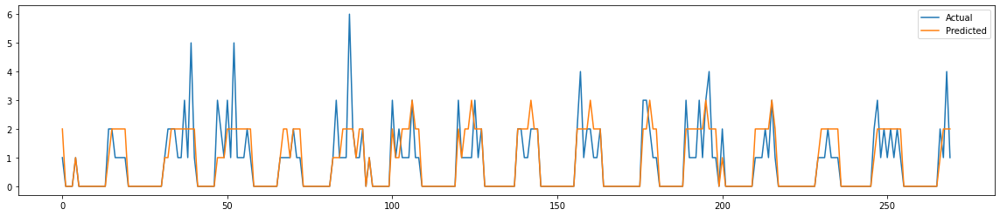

In [27]:
plt.figure(figsize=(20, 4))
plt.plot(industry_data_encoded[industry_data_encoded['Datetime'] >= set_dt]['Industry Size'].reset_index(drop=True), label='Actual',)
plt.plot(y_pred_r, label='Predicted')


plt.legend()
plt.show();